In [1]:
#Modules for EDA
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
plt.style.use('fivethirtyeight')

%matplotlib inline

In [2]:
df = pd.read_csv('/content/Rainfall_Data_LL.csv')
df.shape

(4187, 22)

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4187 entries, 0 to 4186
Data columns (total 22 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Name            4187 non-null   object 
 1   SUBDIVISION     4187 non-null   object 
 2   YEAR            4187 non-null   int64  
 3   JAN             4187 non-null   float64
 4   FEB             4187 non-null   float64
 5   MAR             4187 non-null   float64
 6   APR             4187 non-null   float64
 7   MAY             4187 non-null   float64
 8   JUN             4187 non-null   float64
 9   JUL             4187 non-null   float64
 10  AUG             4187 non-null   float64
 11  SEP             4187 non-null   float64
 12  OCT             4187 non-null   float64
 13  NOV             4187 non-null   float64
 14  DEC             4187 non-null   float64
 15  ANNUAL          4187 non-null   float64
 16  Jan-Feb         4187 non-null   float64
 17  Mar-May         4187 non-null   f

In [5]:
df.drop('Name',axis=1,inplace=True)
df.head()

,SUBDIVISION,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,...,OCT,NOV,DEC,ANNUAL,Jan-Feb,Mar-May,June-September,Oct-Dec,Latitude,Longitude
0,Andaman & Nicobar Islands,1901,49.2,87.1,29.2,2.3,528.8,517.5,365.1,481.1,...,388.5,558.2,33.6,3373.2,136.3,560.3,1696.3,980.3,12.61124,92.83165
1,Andaman & Nicobar Islands,1902,0.0,159.8,12.2,0.0,446.1,537.1,228.9,753.7,...,197.2,359.0,160.5,3520.7,159.8,458.3,2185.9,716.7,12.61124,92.83165
2,Andaman & Nicobar Islands,1903,12.7,144.0,0.0,1.0,235.1,479.9,728.4,326.7,...,181.2,284.4,225.0,2957.4,156.7,236.1,1874.0,690.6,12.61124,92.83165
3,Andaman & Nicobar Islands,1904,9.4,14.7,0.0,202.4,304.5,495.1,502.0,160.1,...,222.2,308.7,40.1,3079.6,24.1,506.9,1977.6,571.0,12.61124,92.83165
4,Andaman & Nicobar Islands,1905,1.3,0.0,3.3,26.9,279.5,628.7,368.7,330.5,...,260.7,25.4,344.7,2566.7,1.3,309.7,1624.9,630.8,12.61124,92.83165


# **Frequency of each Subdivision**

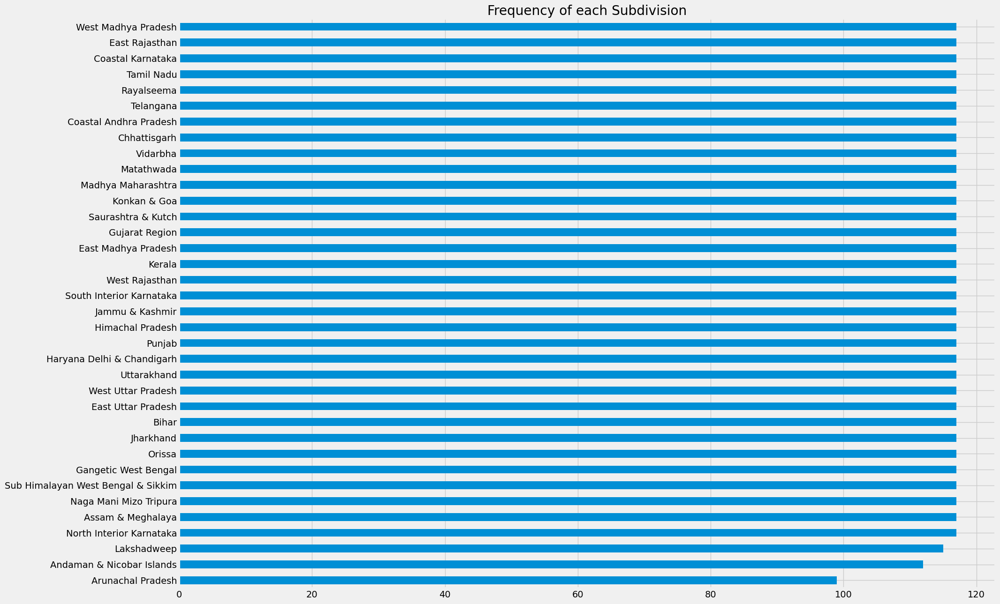

In [7]:
plt.figure(figsize=(20,15))
df['SUBDIVISION'].value_counts().plot(kind='barh')
plt.title('Frequency of each Subdivision')
plt.gca().invert_yaxis()
plt.show()

In [8]:
df['SUBDIVISION'].value_counts()

West Madhya Pradesh                   117
East Rajasthan                        117
Coastal Karnataka                     117
Tamil Nadu                            117
Rayalseema                            117
Telangana                             117
Coastal Andhra Pradesh                117
Chhattisgarh                          117
Vidarbha                              117
Matathwada                            117
Madhya Maharashtra                    117
Konkan & Goa                          117
Saurashtra & Kutch                    117
Gujarat Region                        117
East Madhya Pradesh                   117
Kerala                                117
West Rajasthan                        117
South Interior Karnataka              117
Jammu & Kashmir                       117
Himachal Pradesh                      117
Punjab                                117
Haryana Delhi & Chandigarh            117
Uttarakhand                           117
West Uttar Pradesh                

# **State Wise analysis**

In [9]:
states = df['SUBDIVISION'].unique()
state_df = df.groupby('SUBDIVISION')

### **Unique States and Union Territories**

In [10]:
states

array(['Andaman & Nicobar Islands', 'Arunachal Pradesh',
       'Assam & Meghalaya', 'Naga Mani Mizo Tripura',
       'Sub Himalayan West Bengal & Sikkim', 'Gangetic West Bengal',
       'Orissa', 'Jharkhand', 'Bihar', 'East Uttar Pradesh',
       'West Uttar Pradesh', 'Uttarakhand', 'Haryana Delhi & Chandigarh',
       'Punjab', 'Himachal Pradesh', 'Jammu & Kashmir', 'West Rajasthan',
       'East Rajasthan', 'West Madhya Pradesh', 'East Madhya Pradesh',
       'Gujarat Region', 'Saurashtra & Kutch', 'Konkan & Goa',
       'Madhya Maharashtra', 'Matathwada', 'Vidarbha', 'Chhattisgarh',
       'Coastal Andhra Pradesh', 'Telangana', 'Rayalseema', 'Tamil Nadu',
       'Coastal Karnataka', 'North Interior Karnataka',
       'South Interior Karnataka', 'Kerala', 'Lakshadweep'], dtype=object)

In [11]:
months = df.columns[2:14]

# **Get Region Rainfall Stats (Year and Month wise)**

In [12]:
def getRegionRainfallStats(regionIndex):
    stateName = states[regionIndex]
    state = state_df.get_group(states[regionIndex])
    years = state['YEAR']
    for month in months:
        plt.figure(figsize=(20,7))
        plt.plot(years,state[month],label=month,linewidth=1)
        plt.title(f"{stateName}'s rainfall stats({years.min()}-{years.max()}) in {month} month.")
        plt.xlabel("Year")
        plt.legend()
        plt.show()

# **Let's See Arunachal Pradesh's stats**

In [13]:
#Index of Arunachal Pradesh state
states[1] #1

'Arunachal Pradesh'

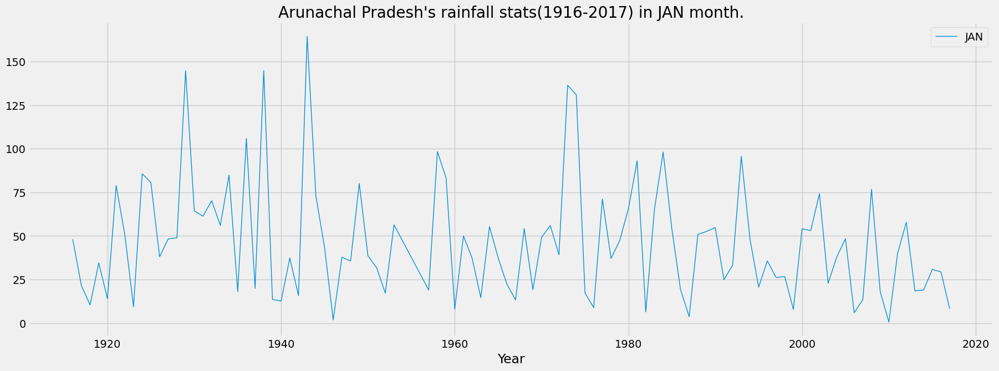

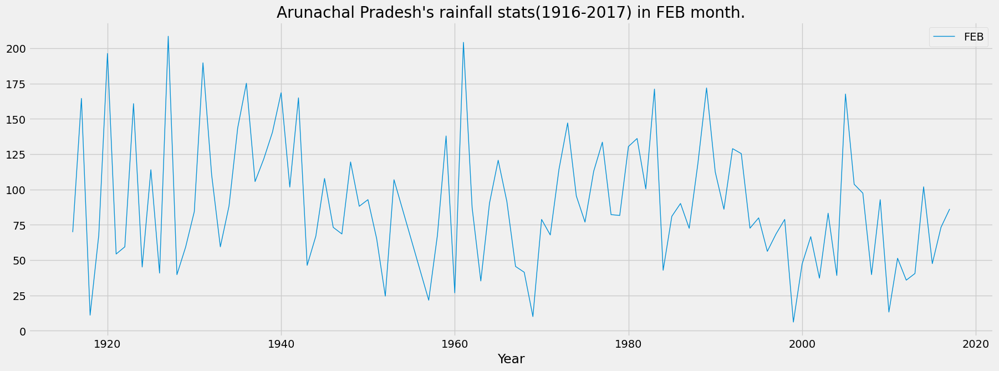

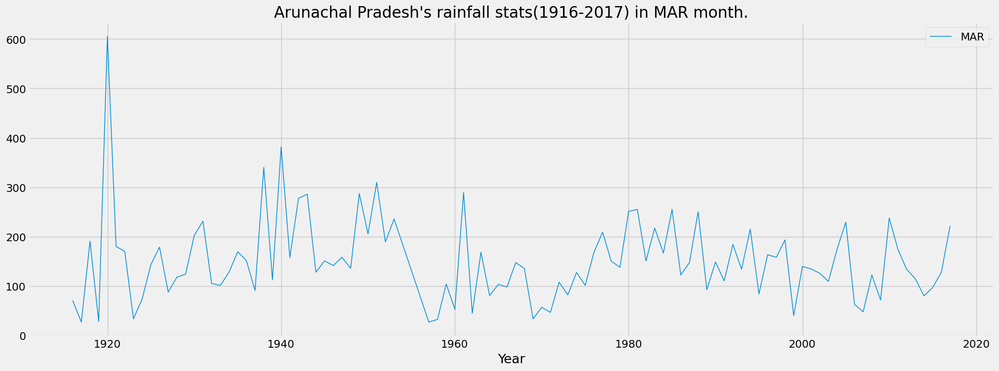

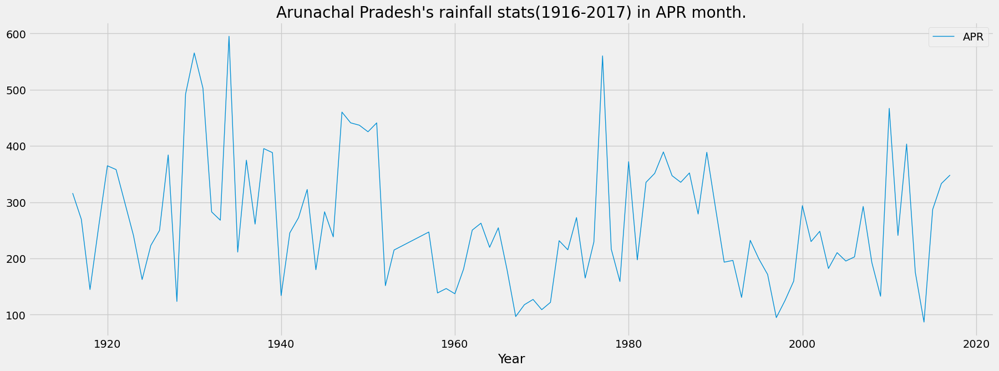

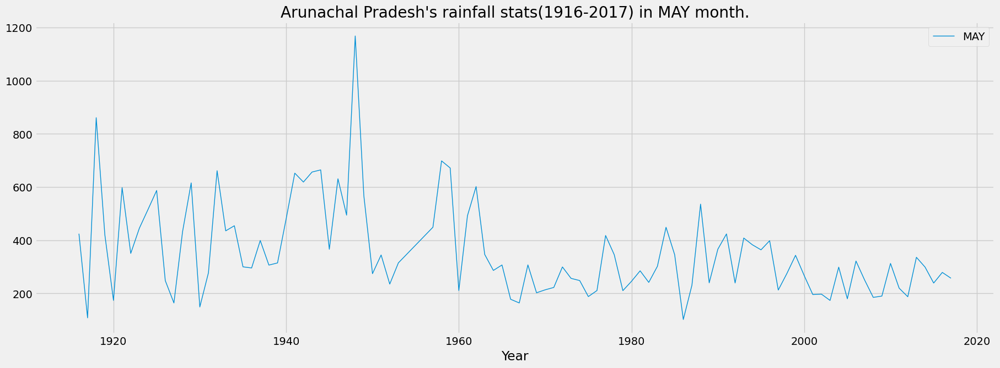

...

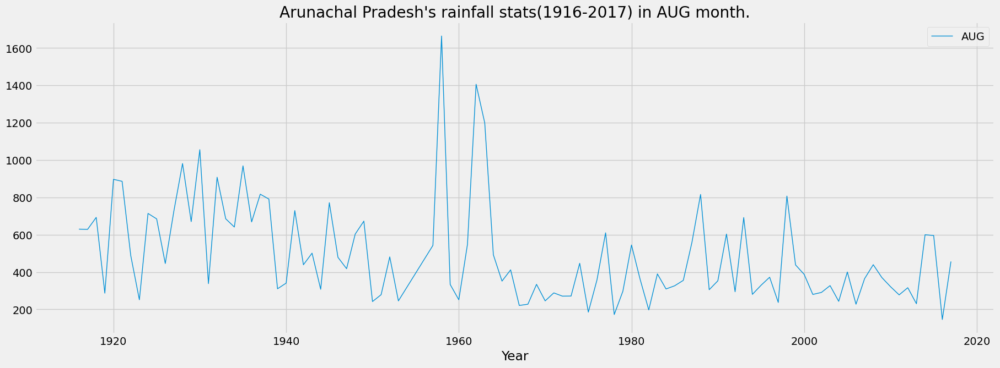

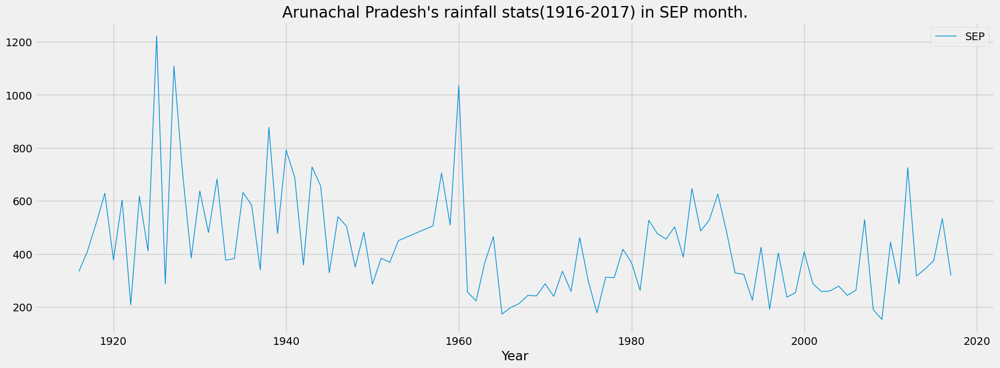

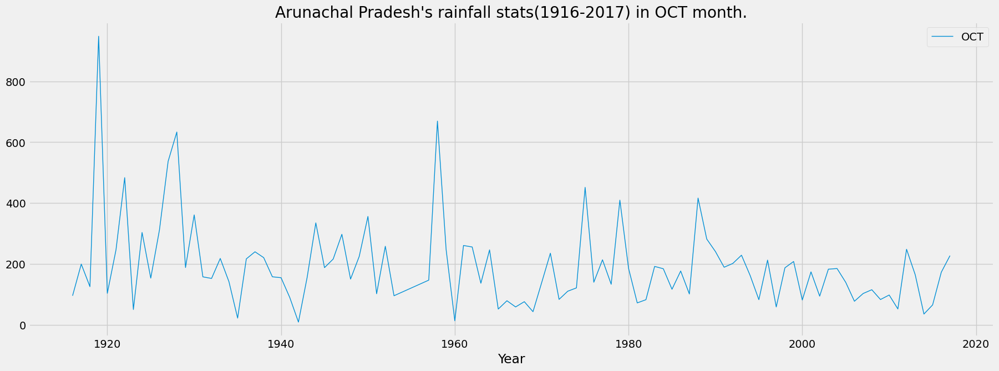

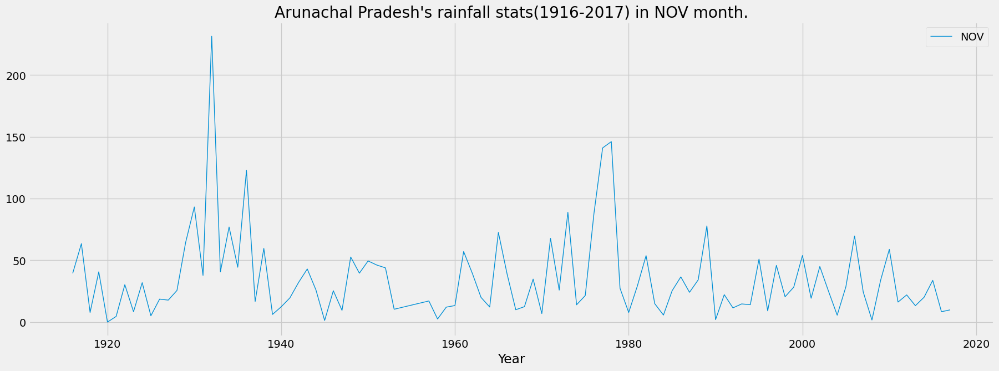

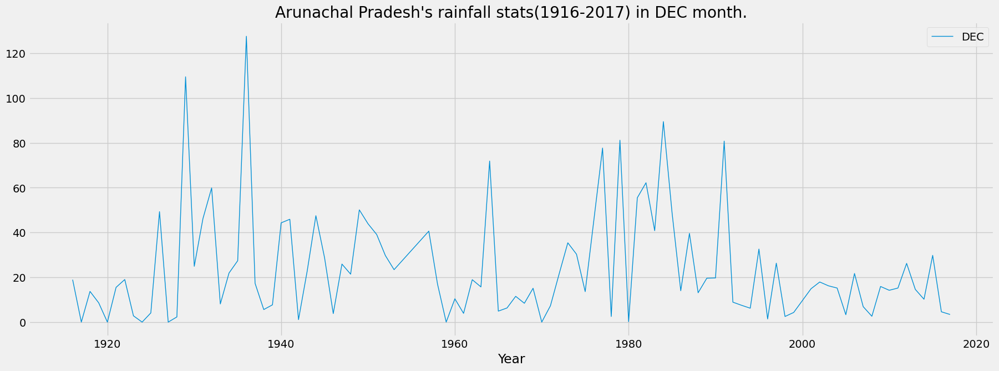

In [14]:
getRegionRainfallStats(1)

# **Let's See west Uttar Pradesh's rainfall stats**

In [15]:
states[10]

'West Uttar Pradesh'

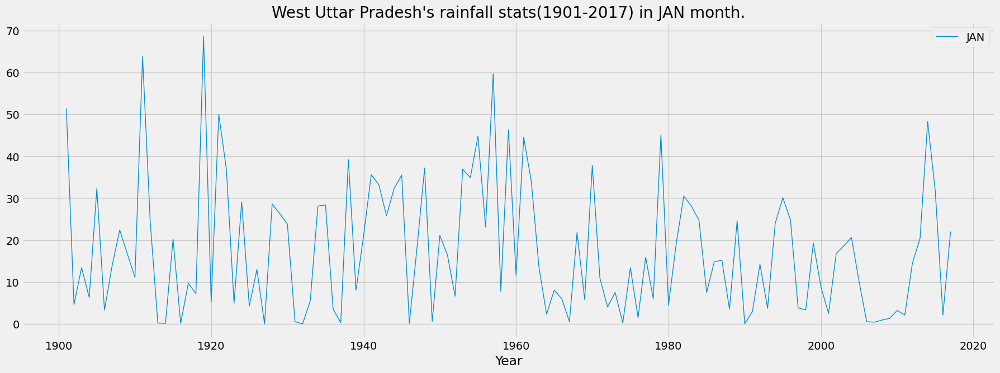

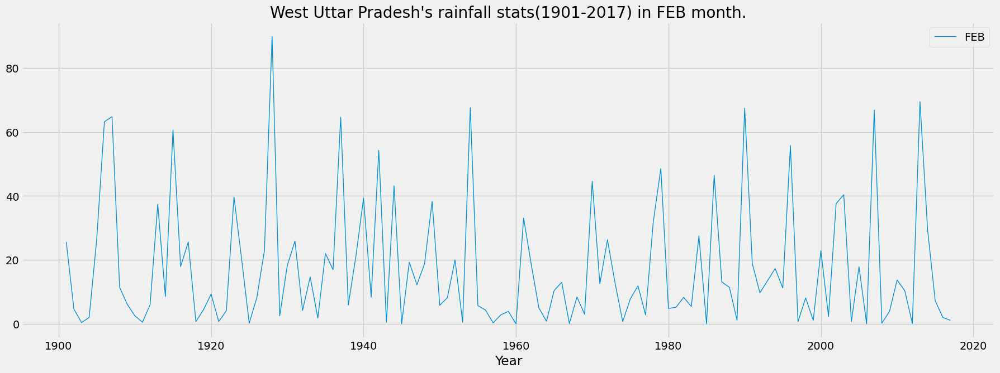

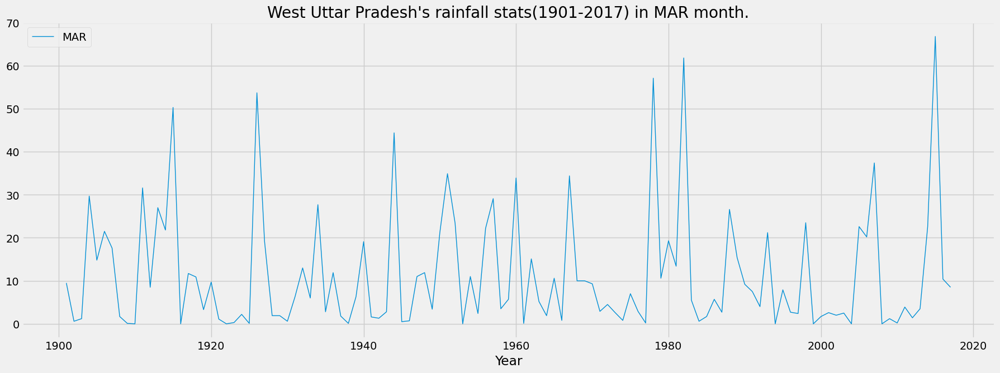

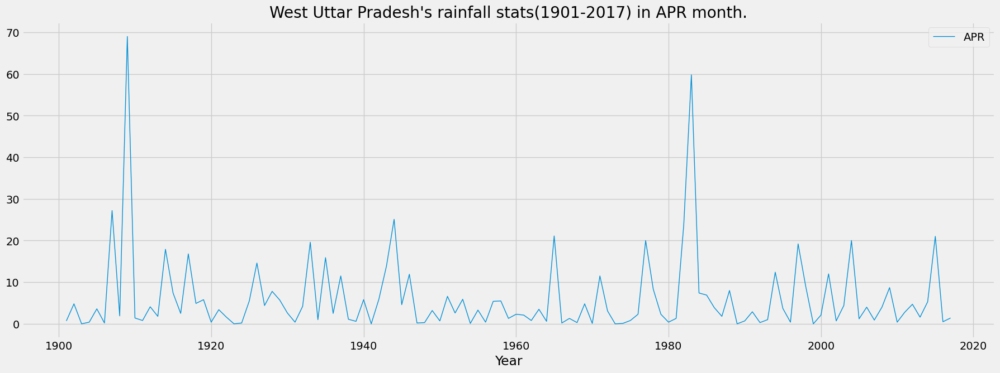

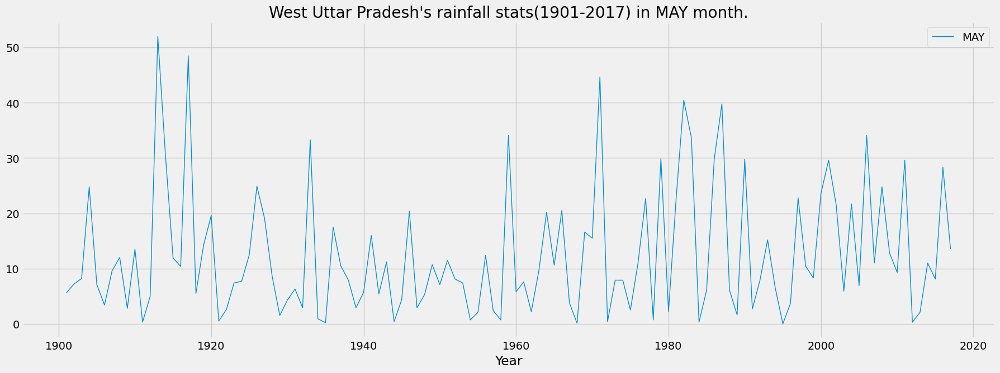

...

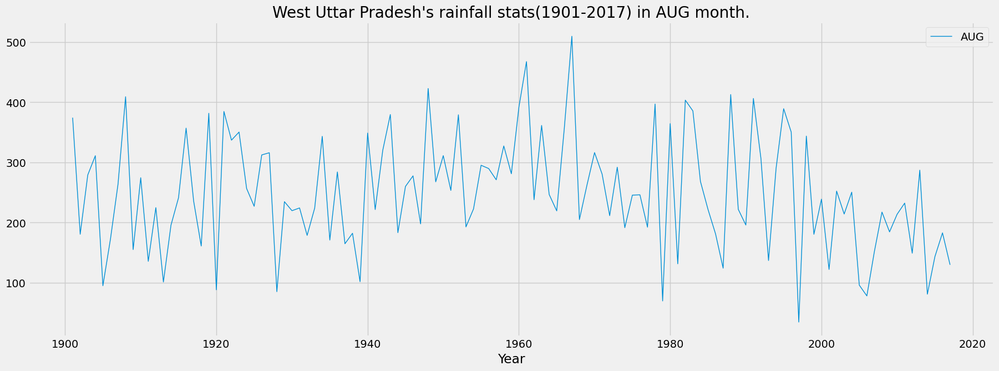

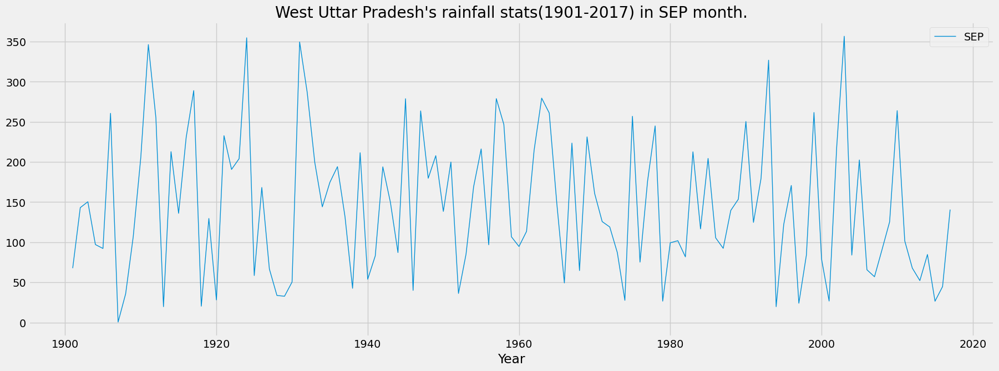

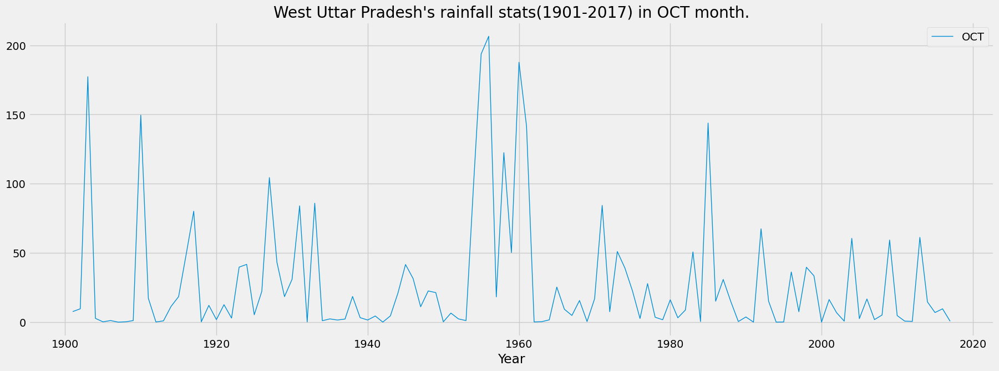

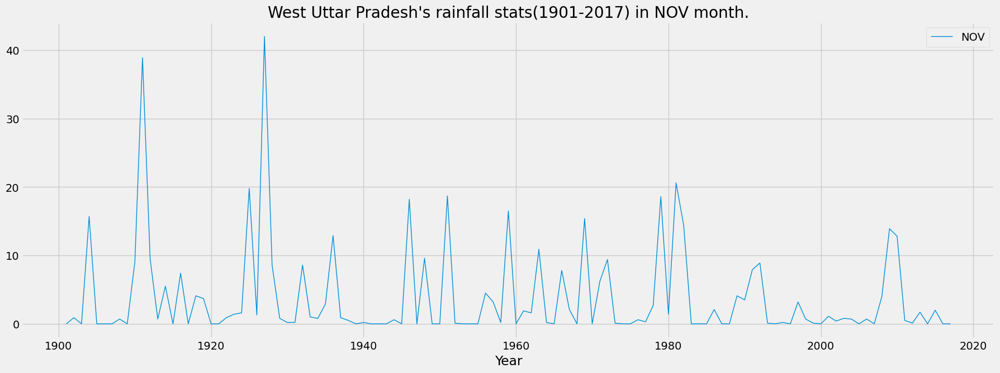

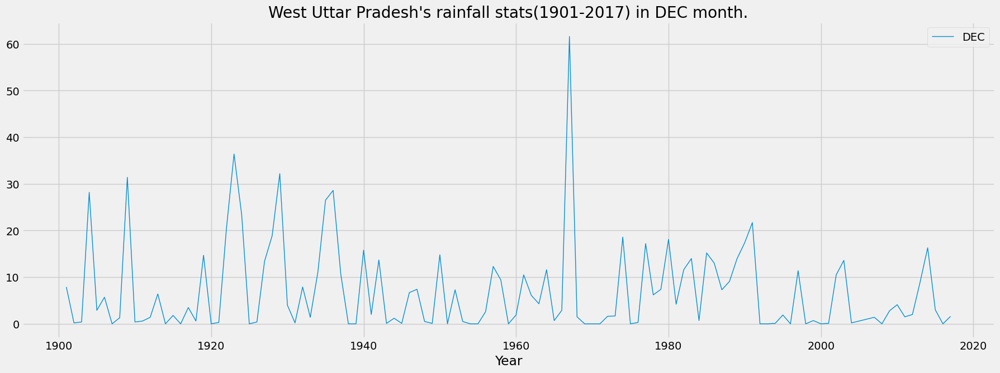

In [16]:
getRegionRainfallStats(10)

#### **Similarly you can check on other regions rainfall by using getRegionRainfallStats function**

# **Visualizing state data of given year.**

In [17]:
def getStateYearData(regionIndex,year,return_data=False):
    try:
        stateName = states[regionIndex]
        dfstate = state_df.get_group(states[regionIndex])
        dfstate.set_index('YEAR',inplace=True)
        year_data = dfstate.loc[year][months]
        plt.figure(figsize=(10,7))
        sns.barplot(x=months,y=year_data.values)
        plt.title(f"Rainfall Data of {stateName} in year {year}")
        plt.show()
        if return_data:
            return year_data
    except KeyError:
        return "Enter Valid Year."
    except IndexError:
        return "Enter Valid State Index."
    except Exception as e:
        print(e)
        return "Opps! Something went."

# **Arunanchal Pradesh rainfall data in year 1990**

In [18]:
states[1] #Index is 1

'Arunachal Pradesh'

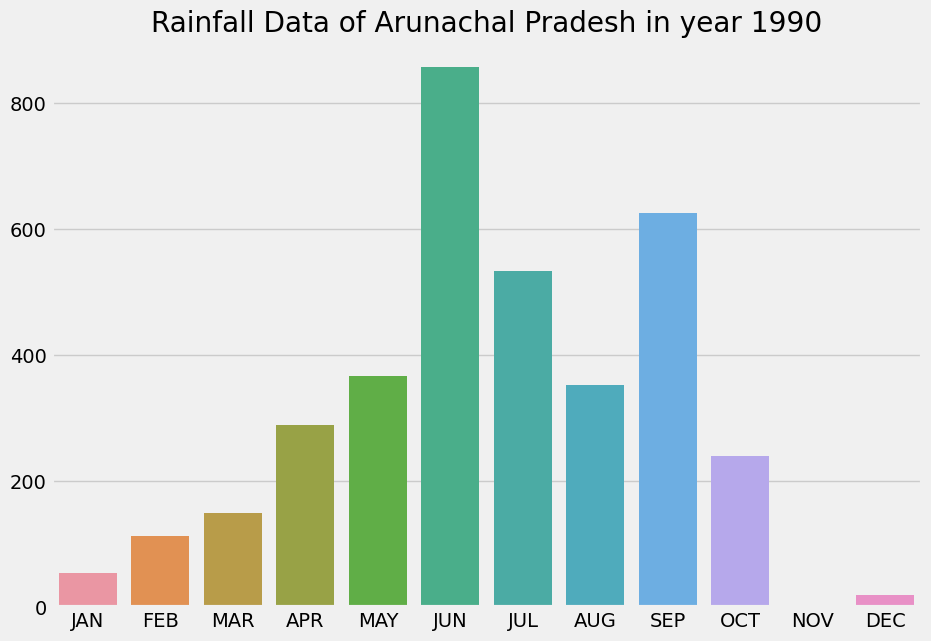

In [19]:
getStateYearData(1,1990)

# **Jammu & Kashmir rainfall data in year 2011**

In [20]:
states[15] #Index is 15

'Jammu & Kashmir'

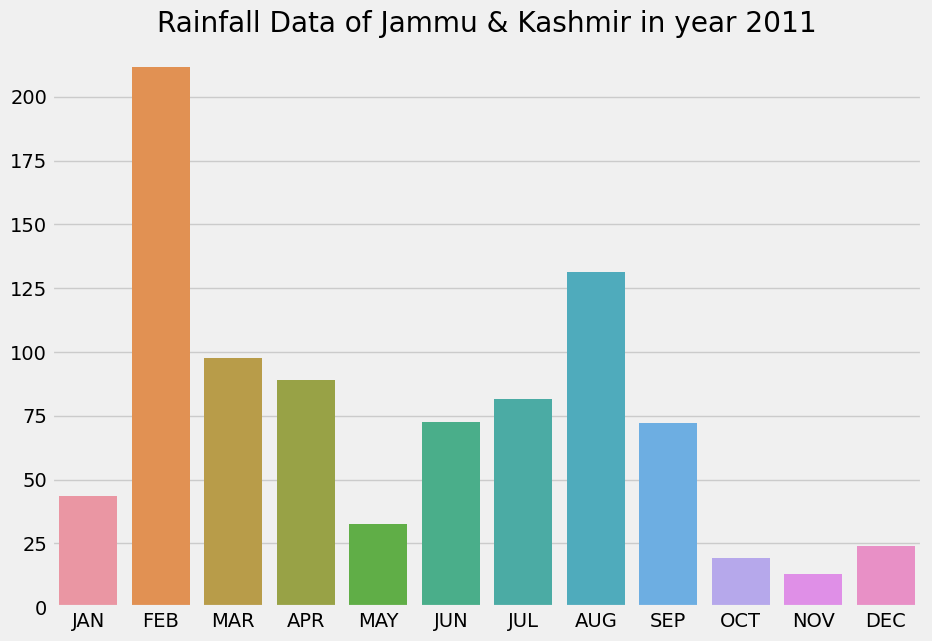

JAN     43.4
FEB    211.6
MAR     97.8
APR     89.0
MAY     32.4
JUN     72.5
JUL     81.6
AUG    131.2
SEP     72.0
OCT     19.4
NOV     12.9
DEC     23.8
Name: 2011, dtype: object

In [21]:
getStateYearData(15,2011,return_data=True)

#### **Similarly you can check on other regions rainfall data of a given year.**

# **Average Rainfall in last five years of each Region (month wise)**

In [22]:
def getLast5AvgRainfallData(regionIndex,return_data=False):

    stateName = states[regionIndex]
    dflast5 = state_df.get_group(states[regionIndex]).tail()

    last5years = dflast5['YEAR']
    rainfallAvg5 = dflast5.tail().mean()[months]

    #Plotting
    plt.figure(figsize=(10,7))
    sns.barplot(x=months, y=rainfallAvg5.values)
    plt.title(f"Average rainfall of {stateName} region in last five years({last5years.min()}-{last5years.max()})")
    plt.ylabel("Months")
    plt.xlabel("Rainfall")
    plt.show()
    if return_data:
        return rainfallAvg5

# **Let's See the Average rainfall of Assam and Meghalaya region in last 5 years**

In [23]:
states[2] #Index is 2

'Assam & Meghalaya'

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


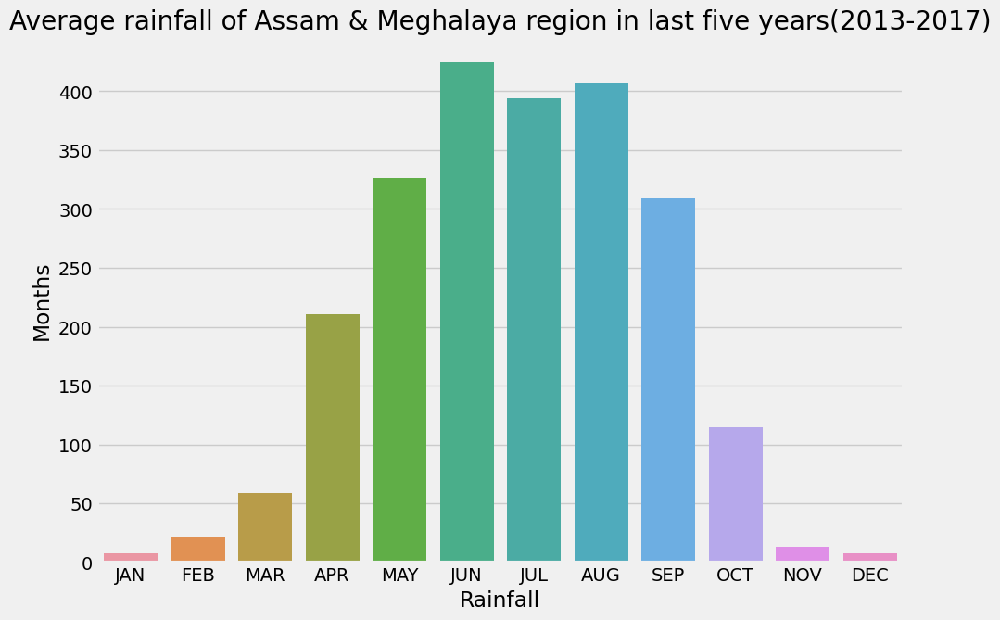

JAN      7.42
FEB     21.42
MAR     58.32
APR    210.78
MAY    326.54
JUN    425.06
JUL    393.94
AUG    406.72
SEP    309.20
OCT    114.50
NOV     13.30
DEC      7.20
dtype: float64

In [24]:
getLast5AvgRainfallData(2,return_data=True)

# **Now we will see the Average Rainfall in last 5 years of each state**

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


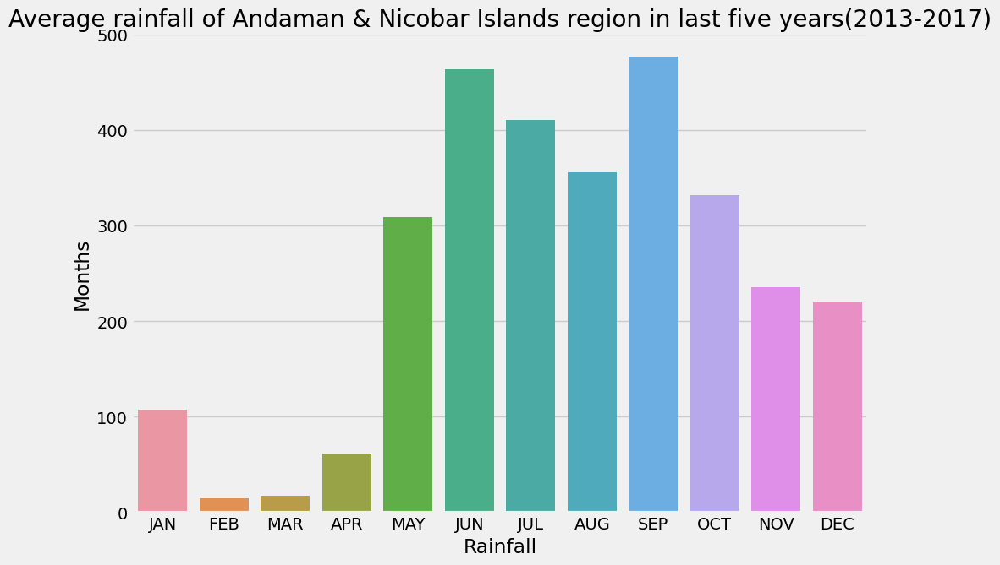

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


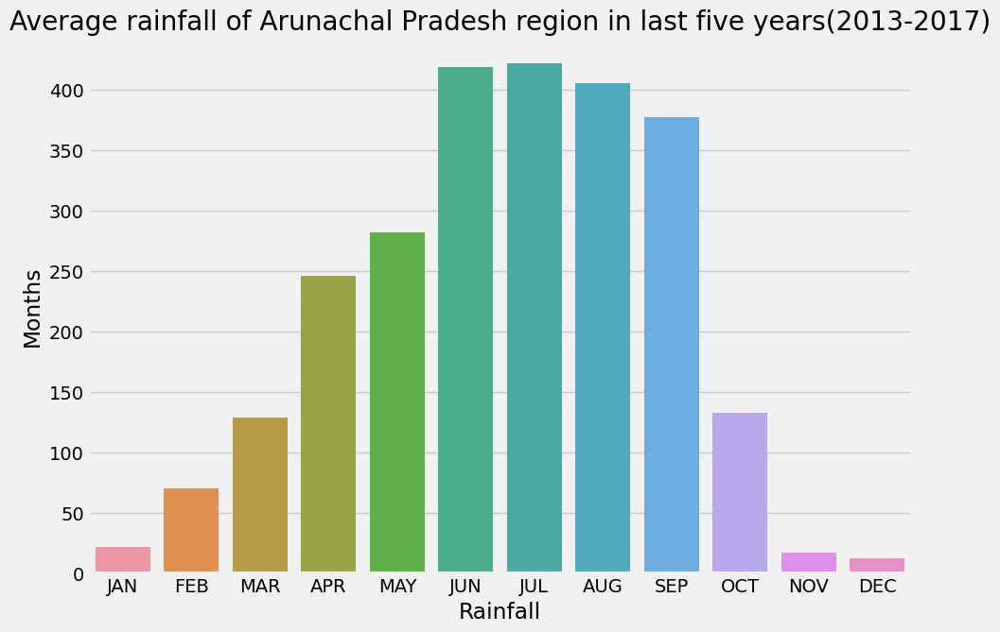

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


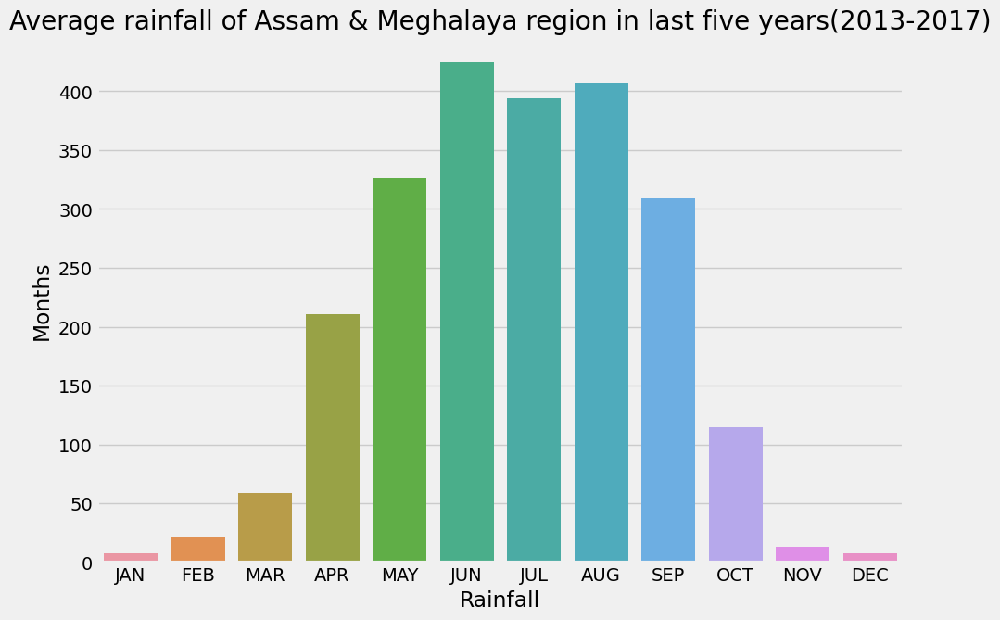

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


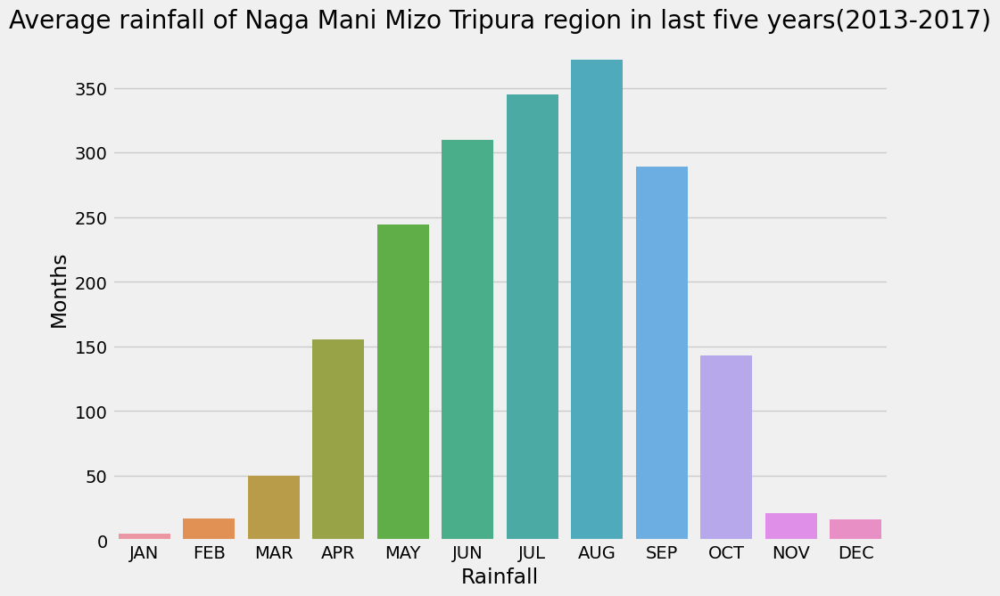

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


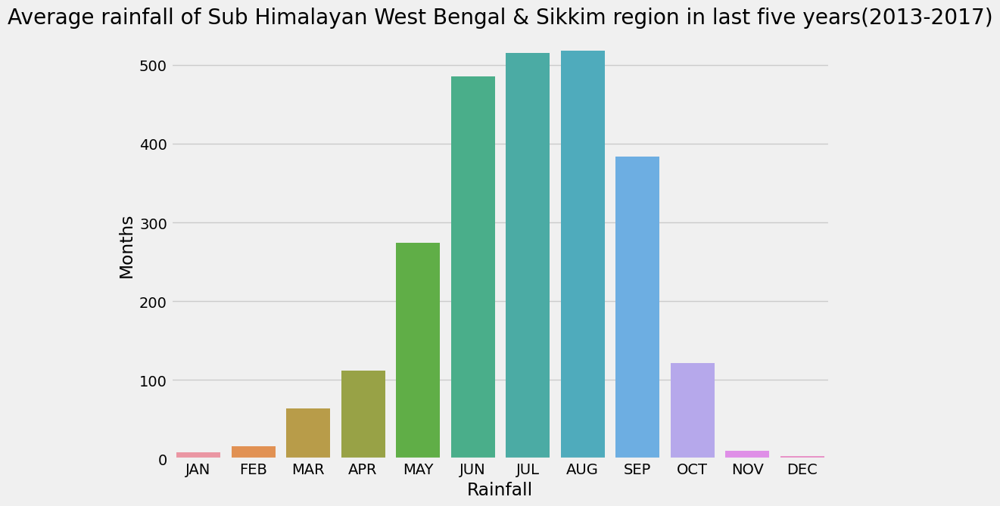

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


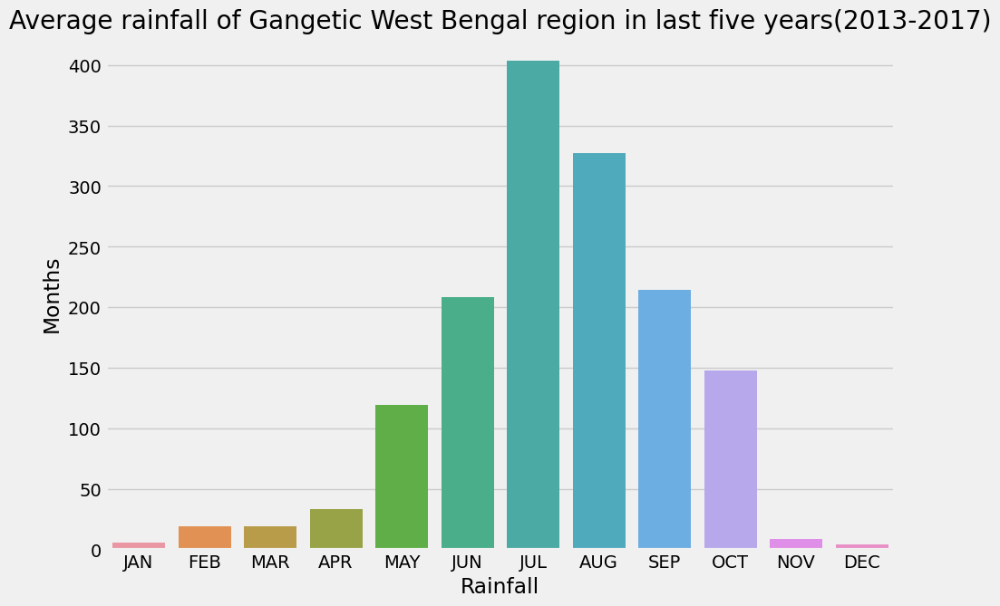

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


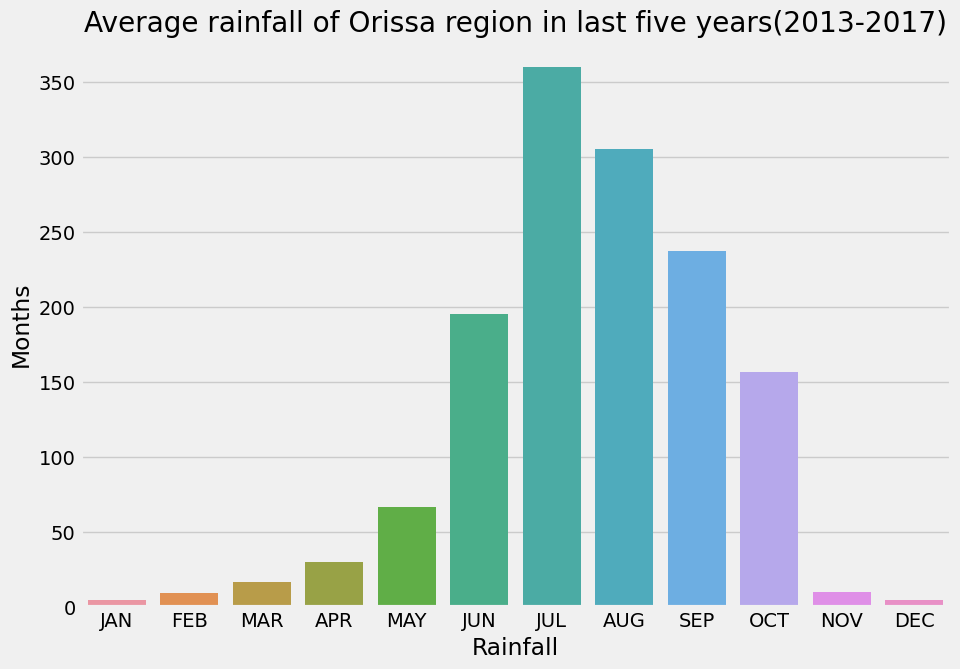

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


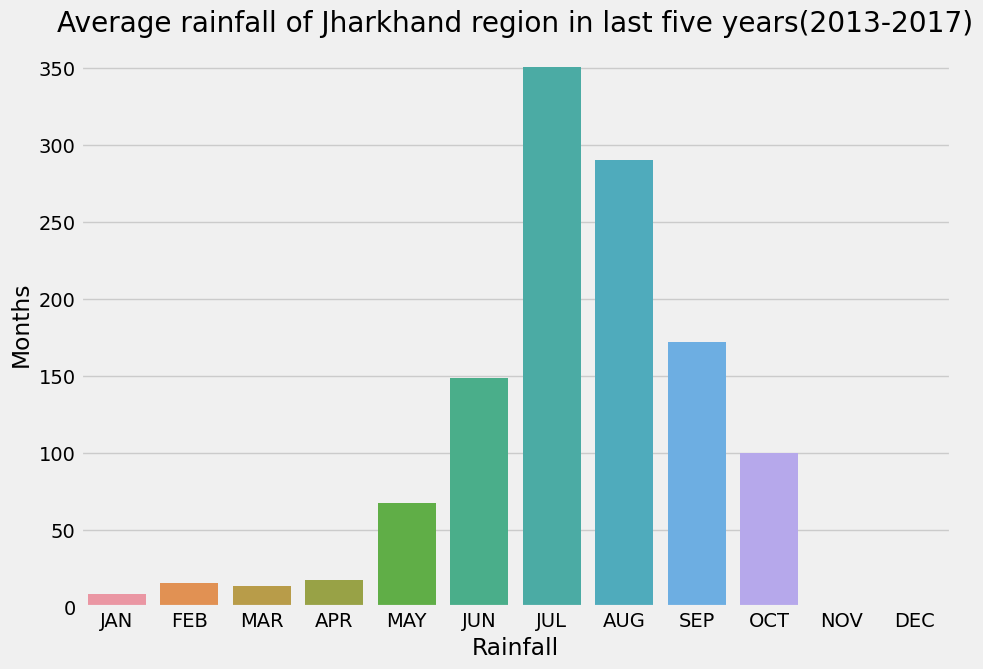

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


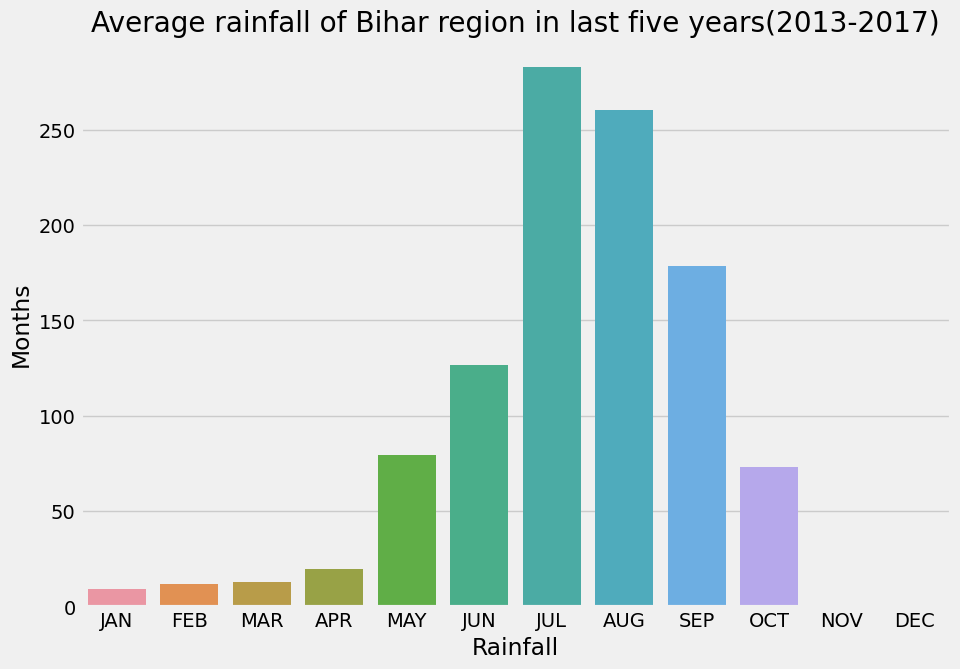

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


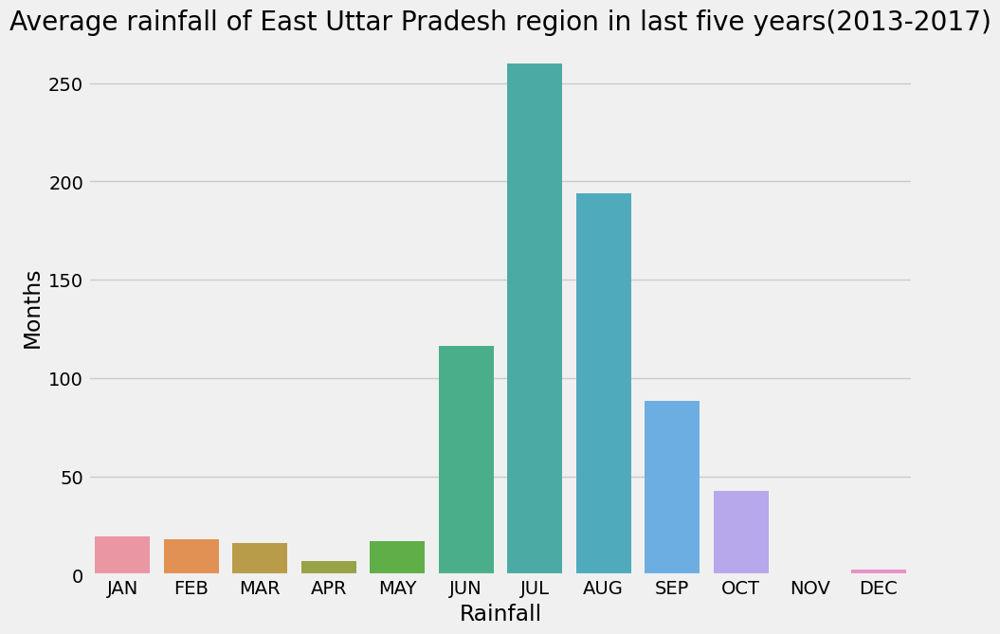

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


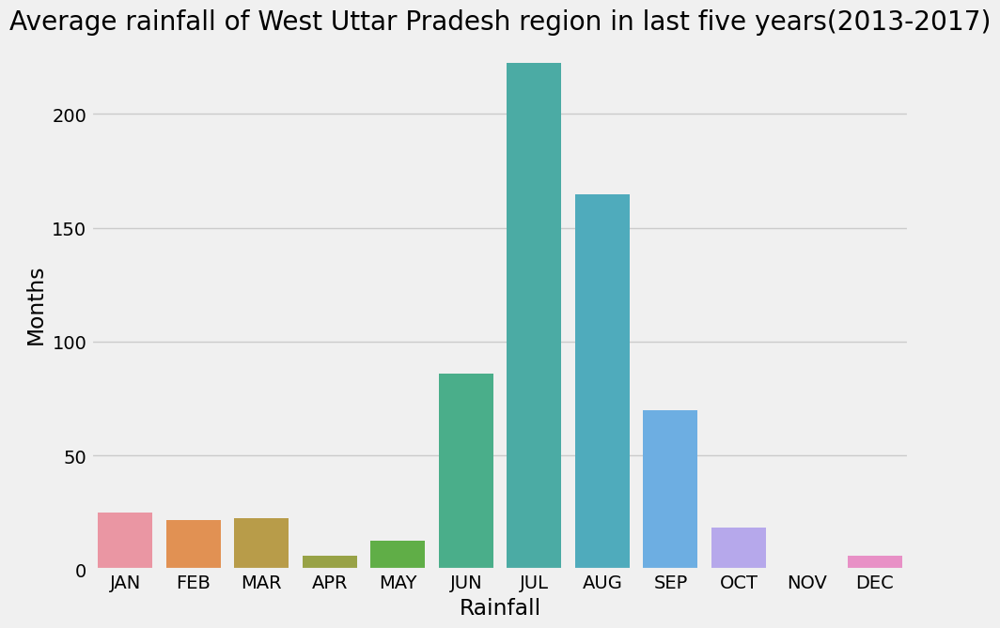

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


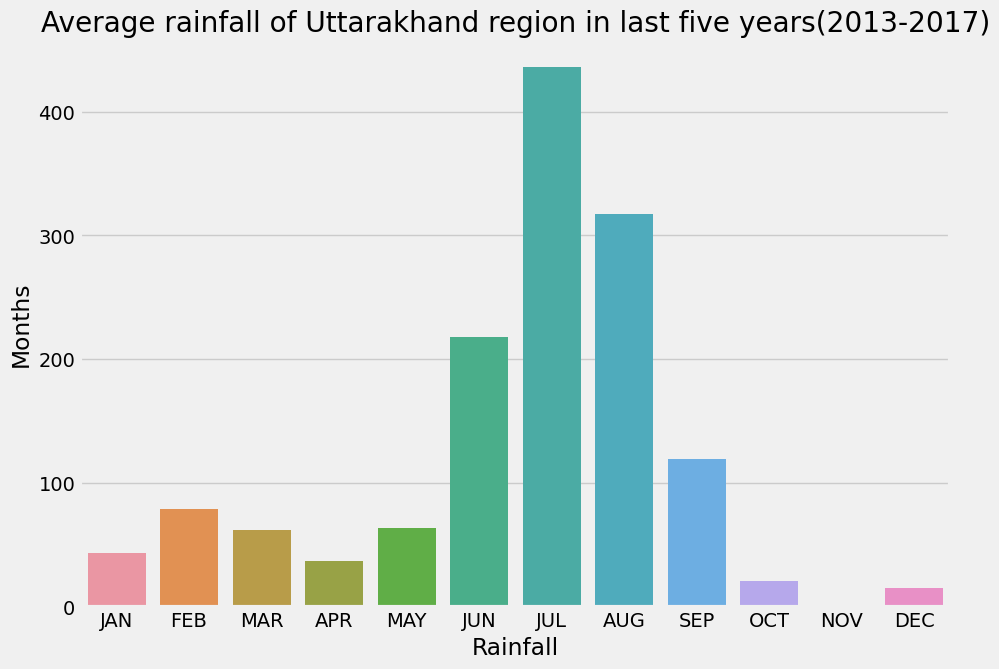

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


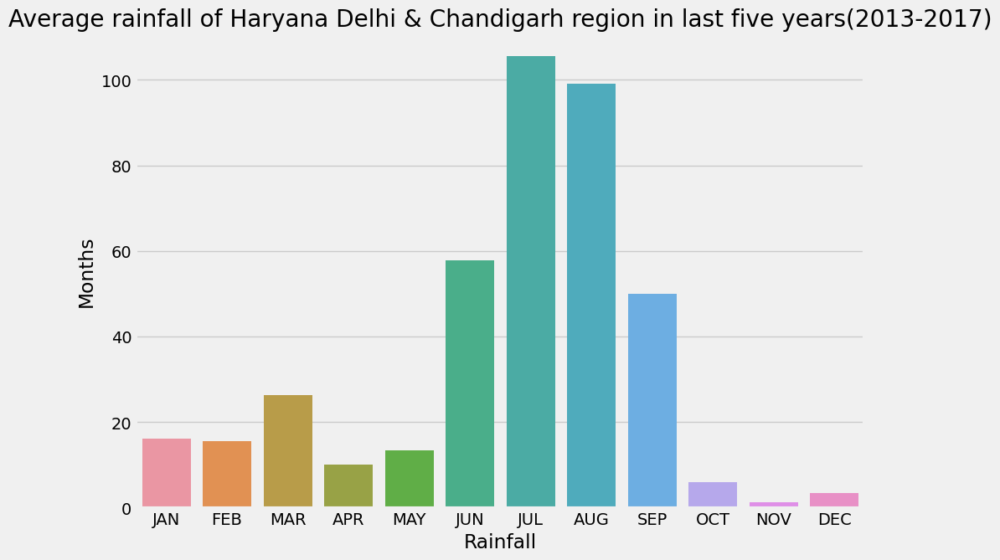

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


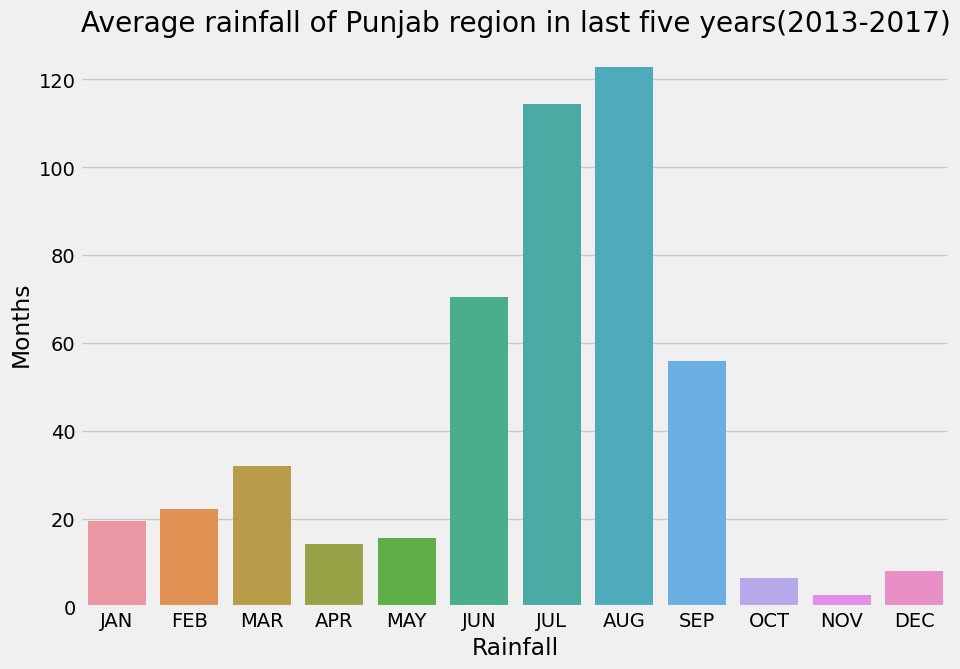

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


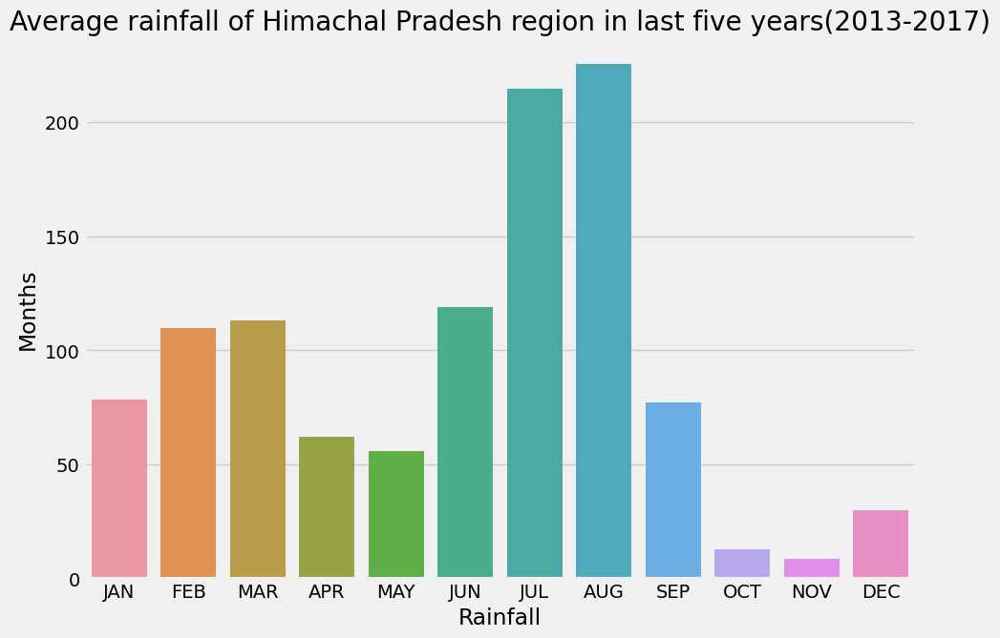

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


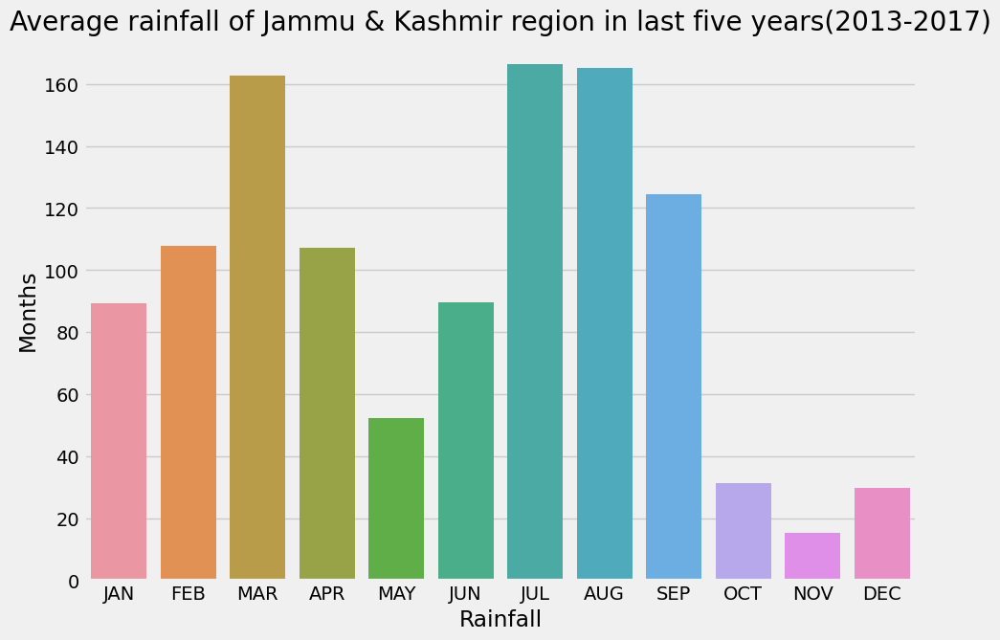

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


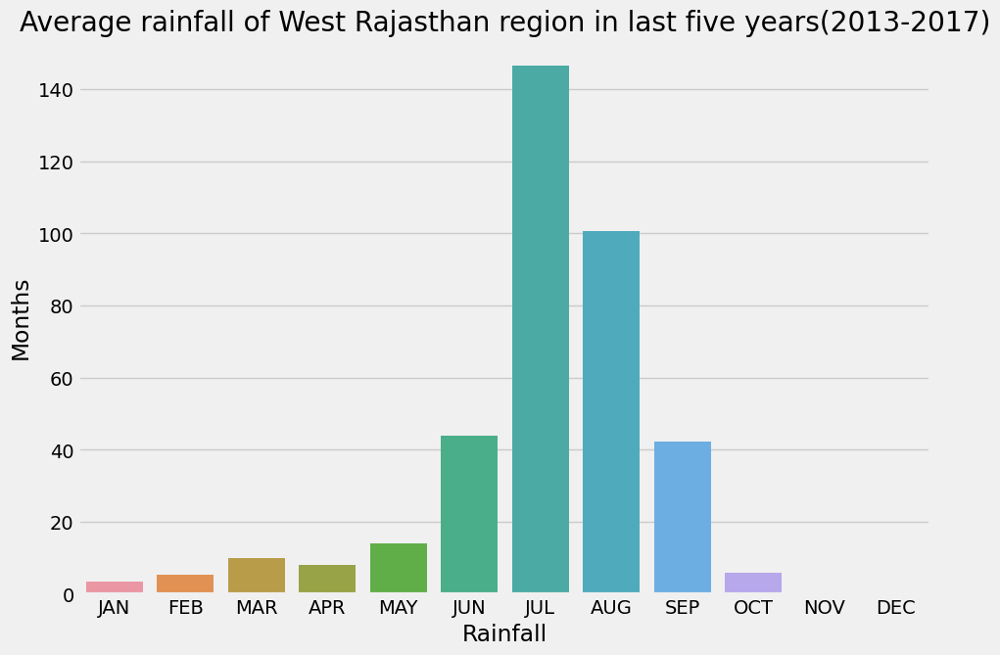

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


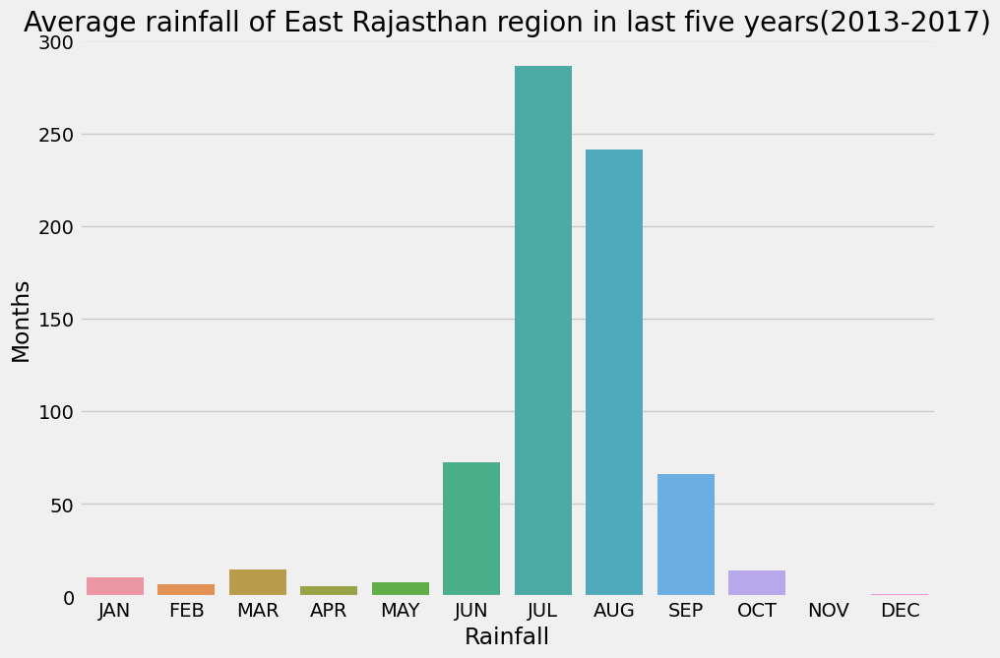

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


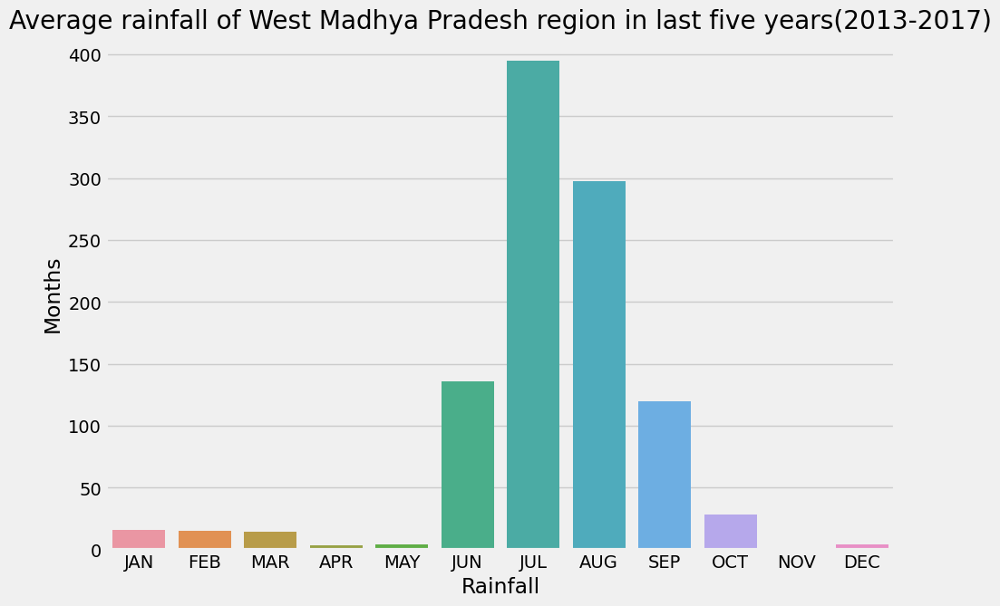

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


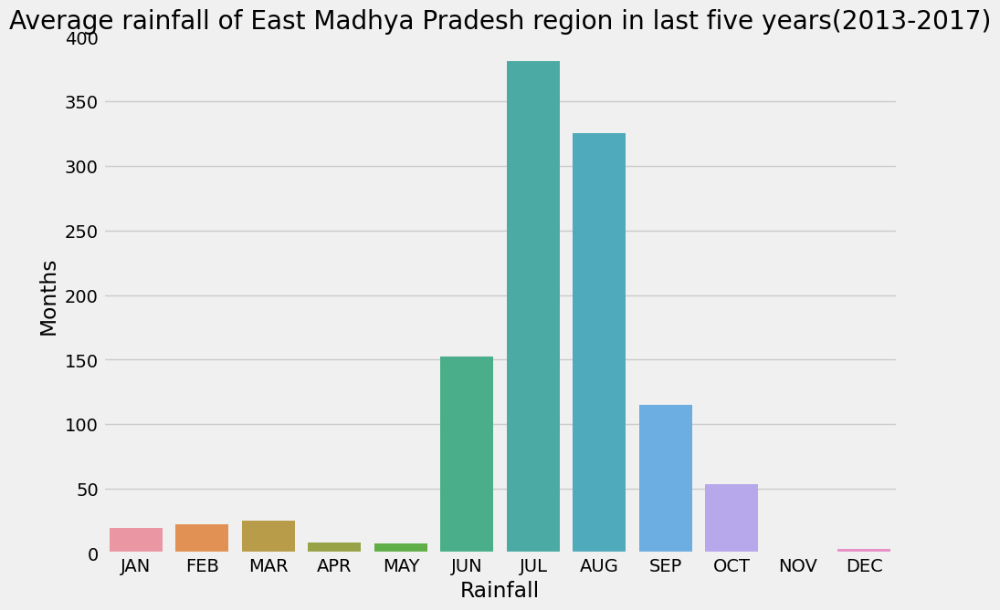

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


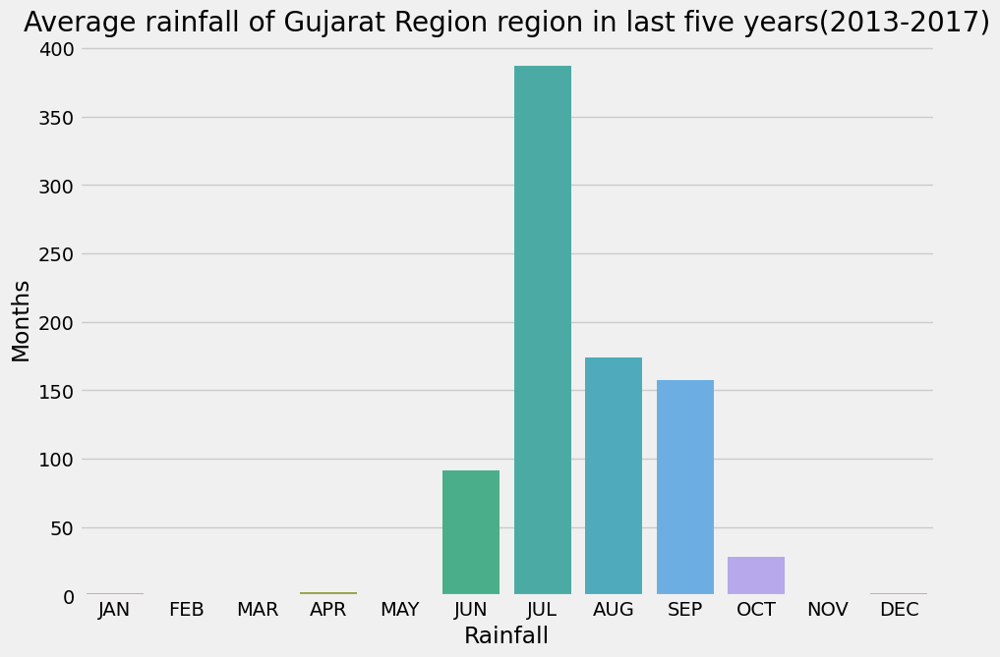

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


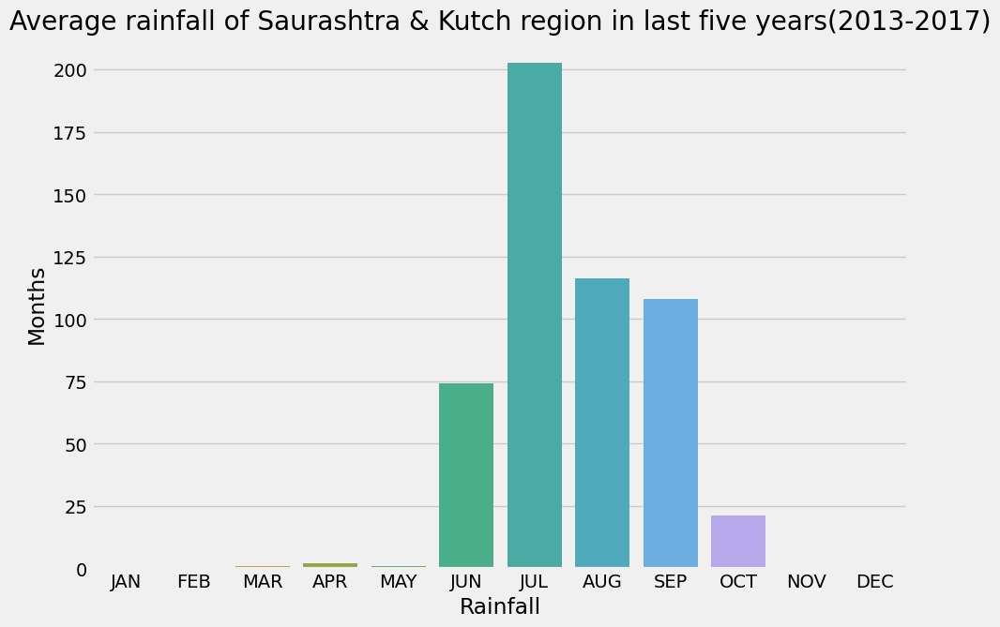

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


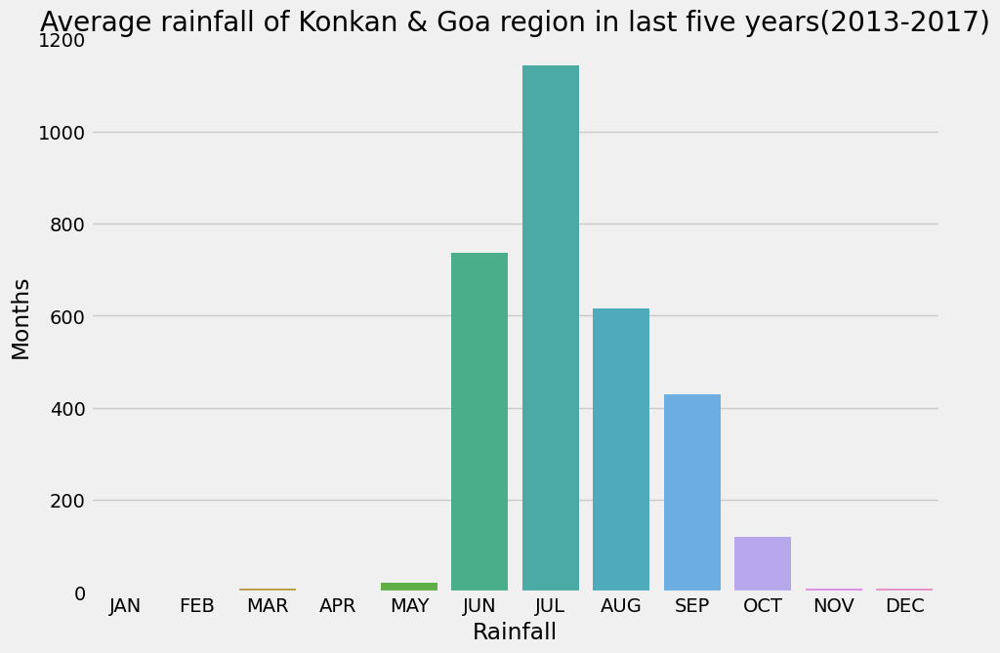

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


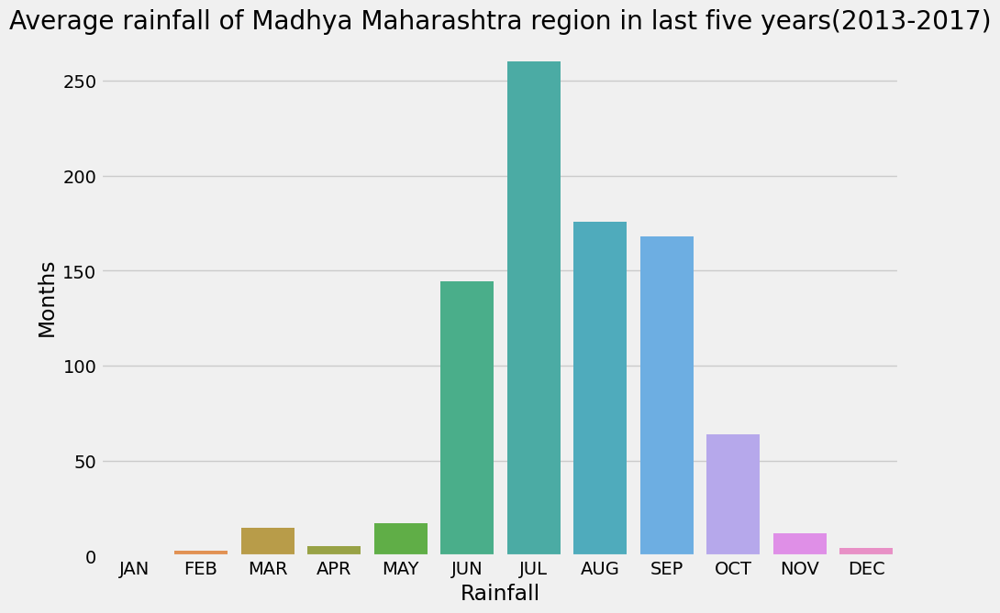

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


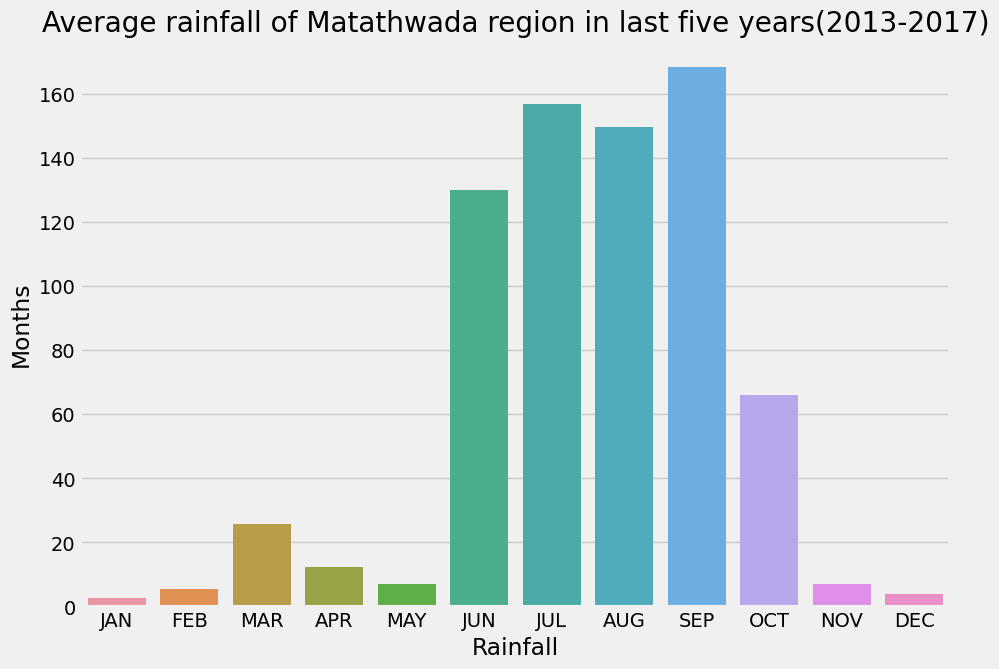

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


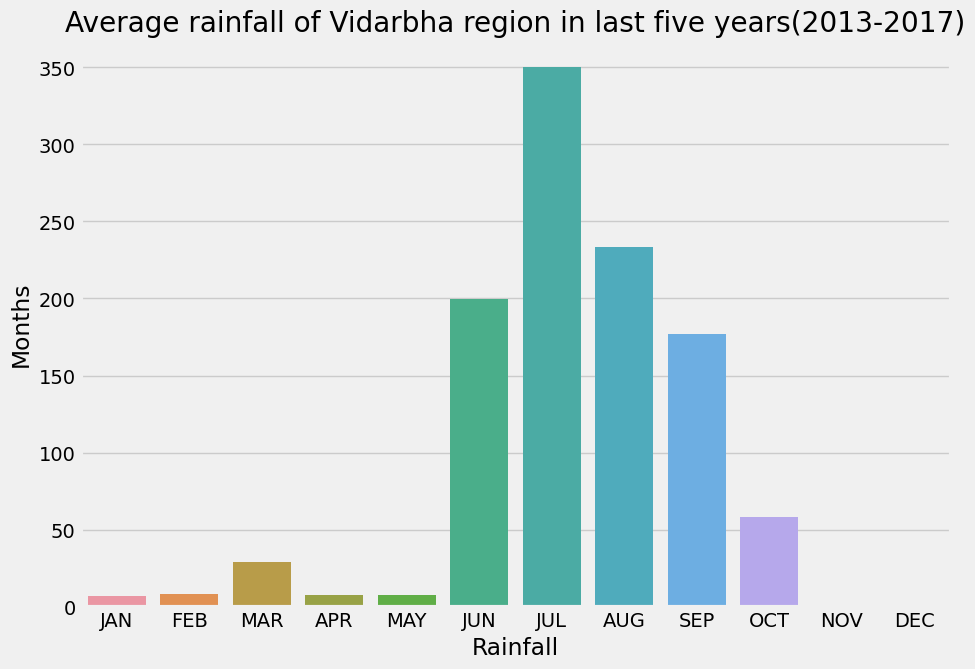

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


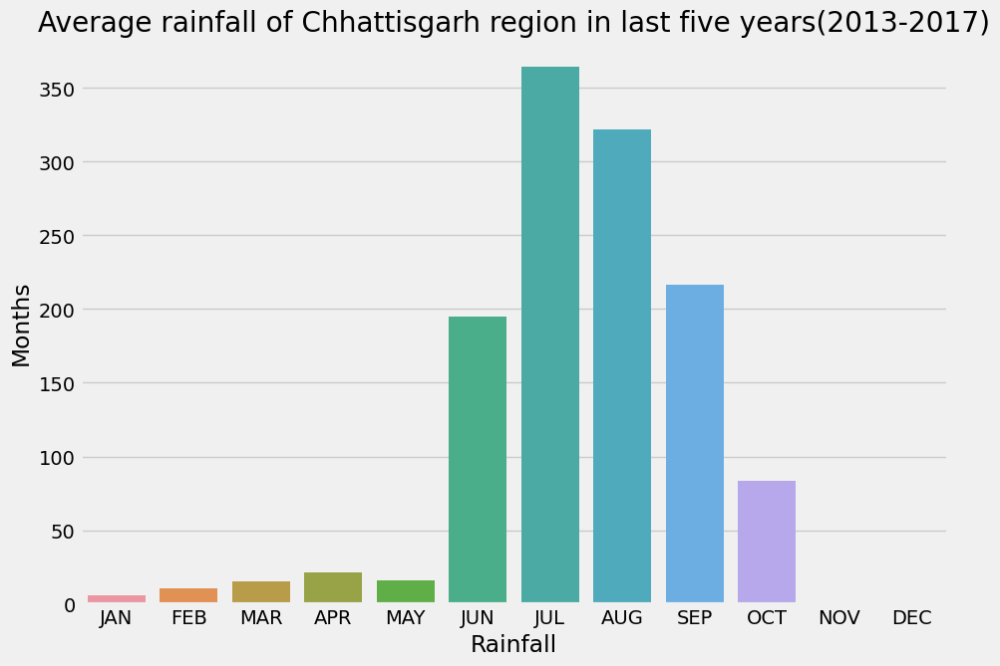

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


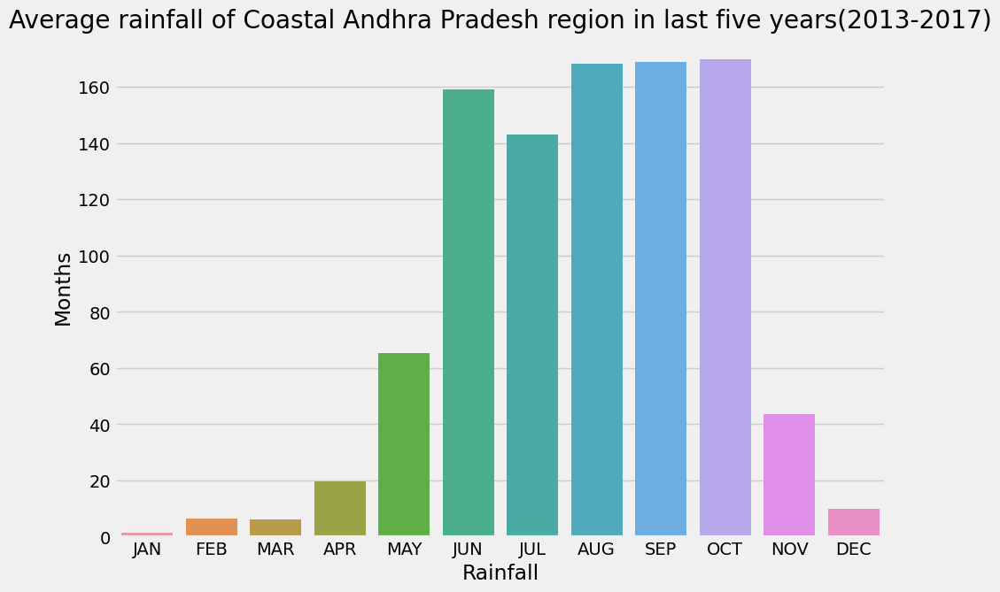

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


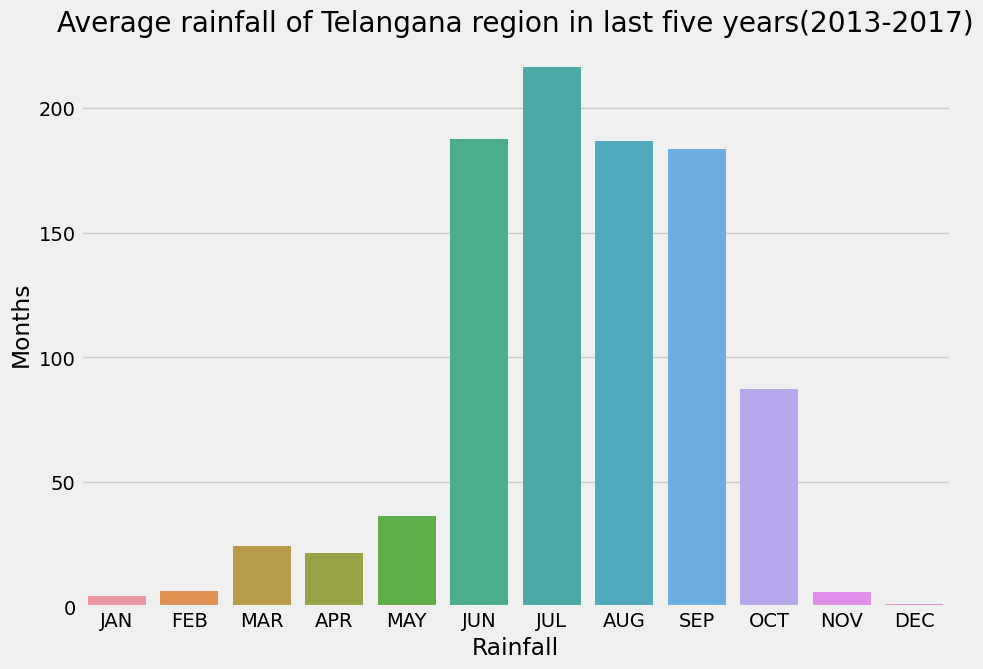

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


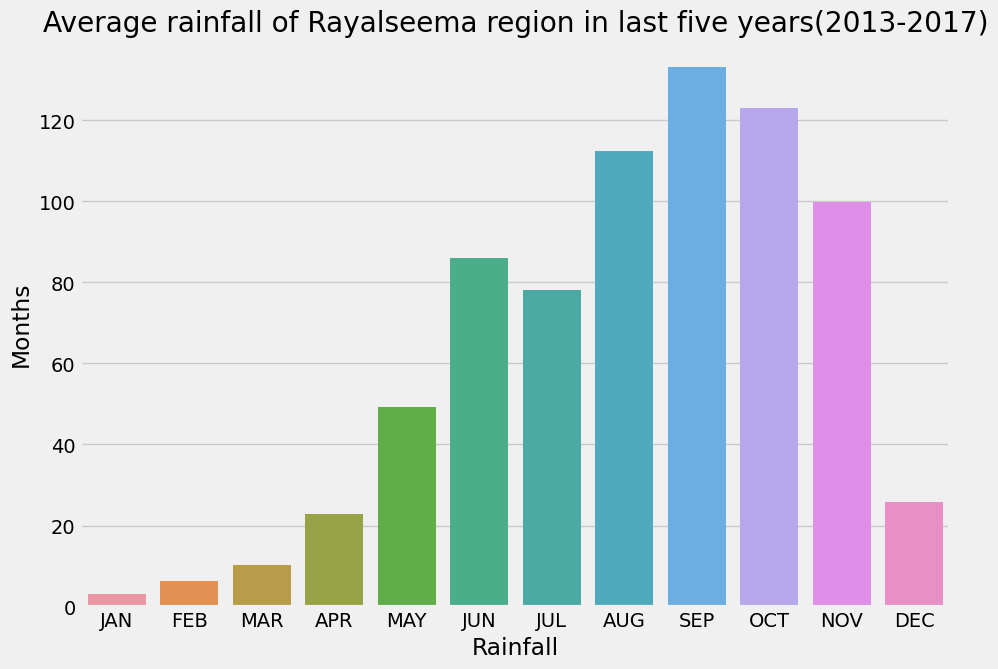

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


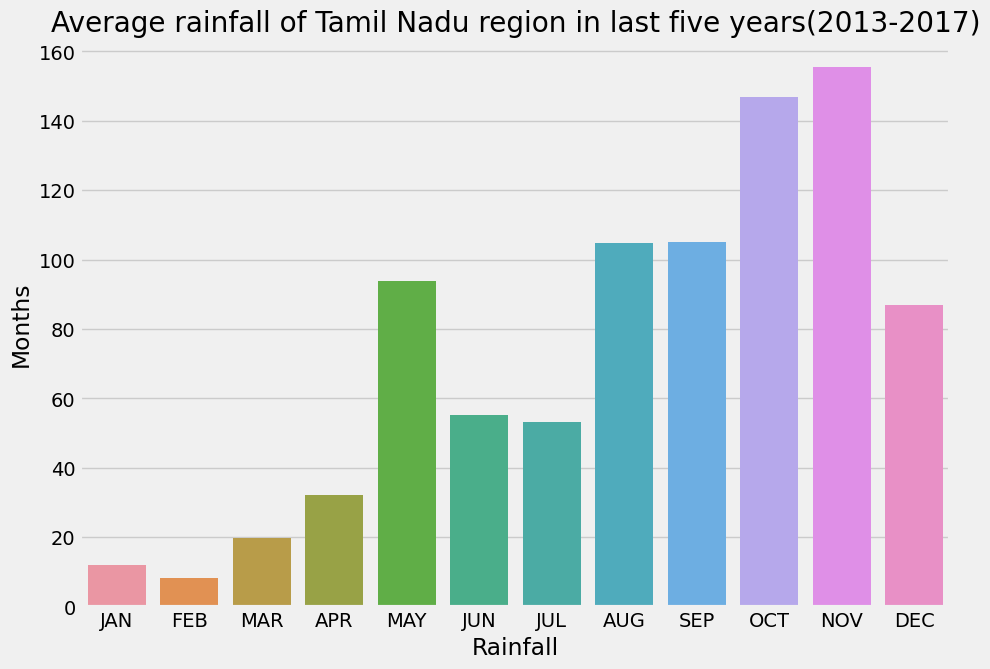

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


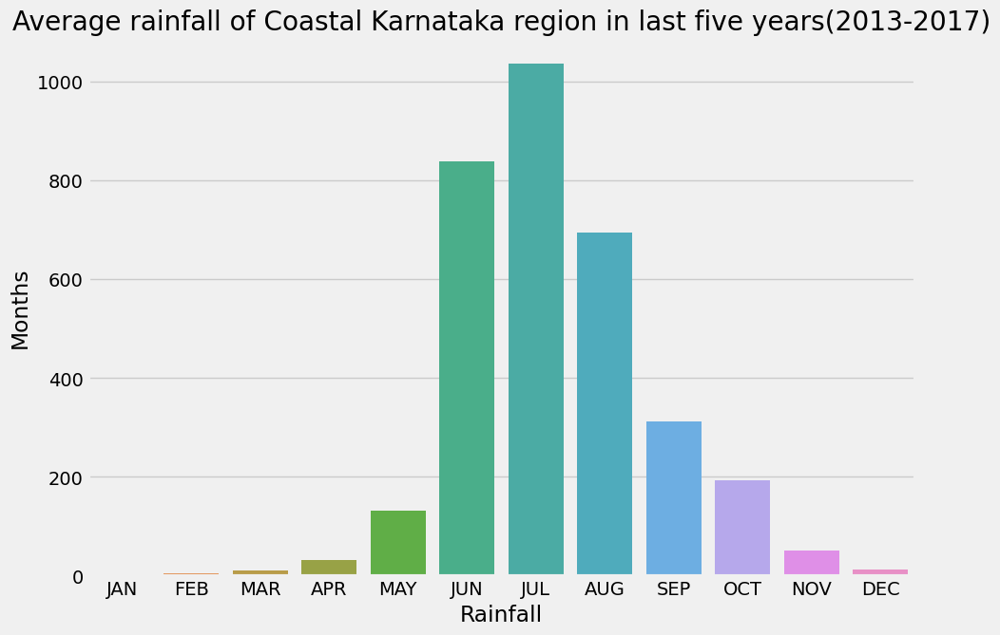

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


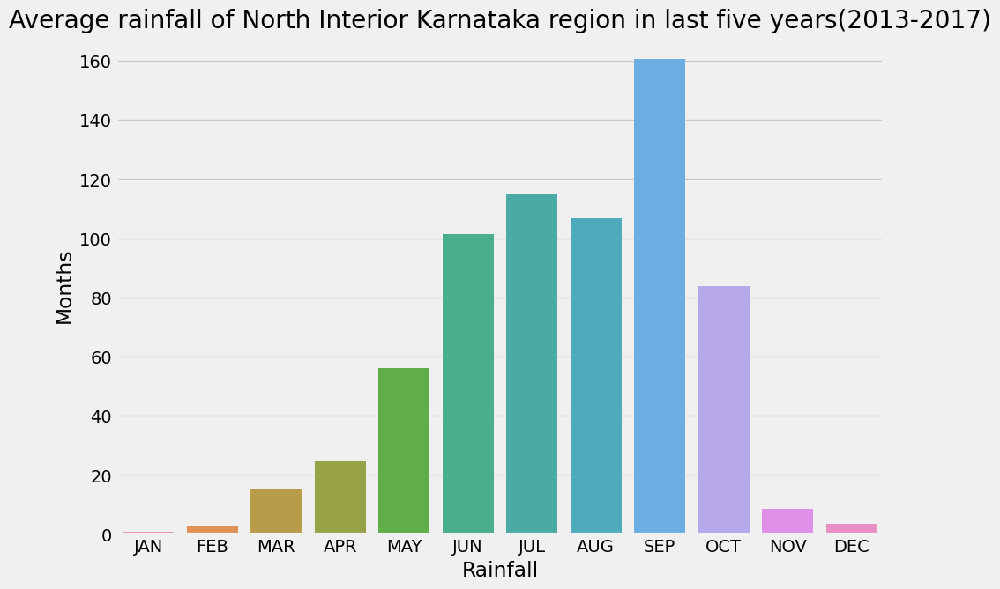

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


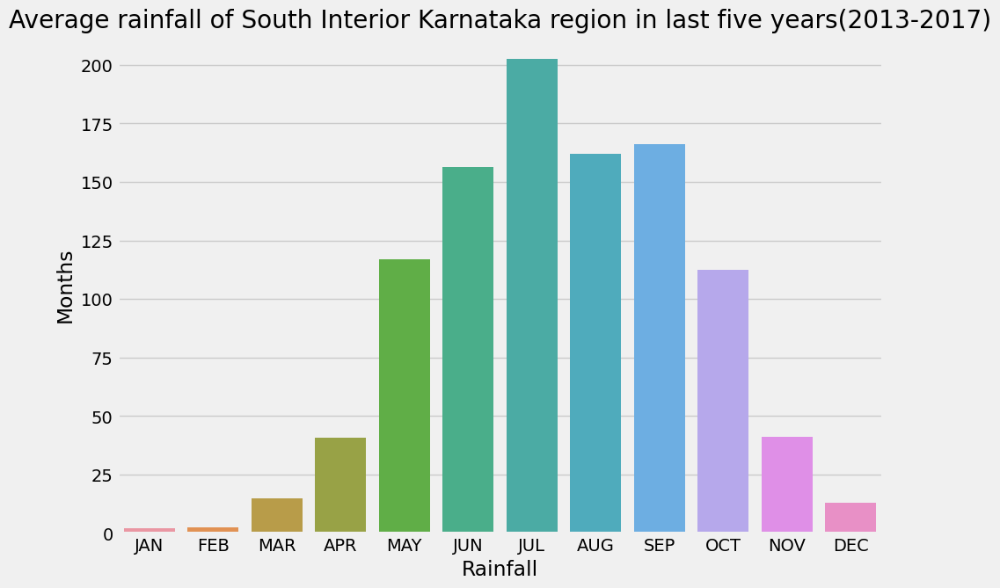

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


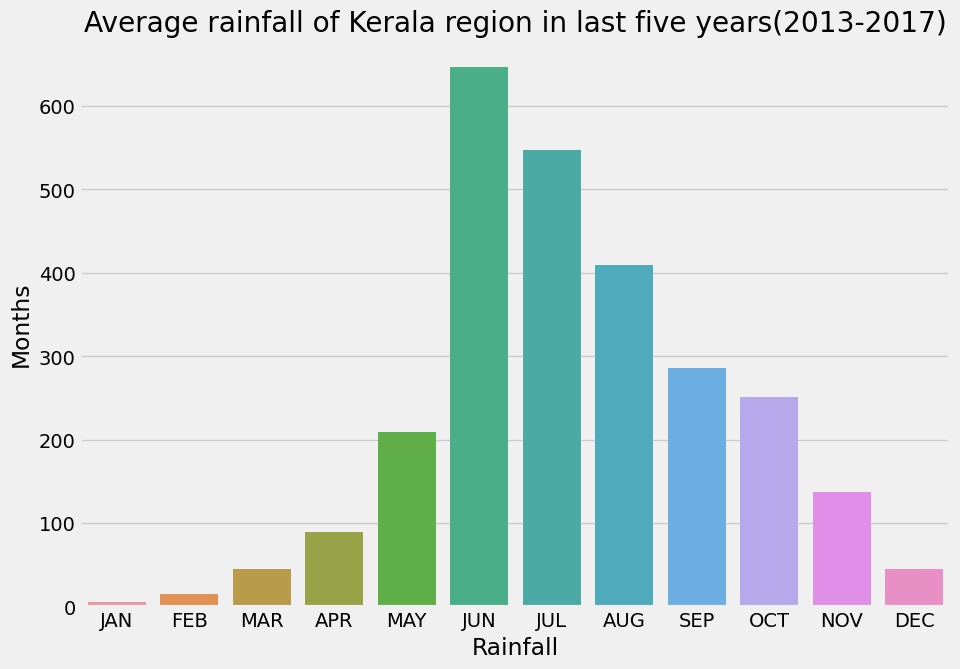

<ipython-input-22-30c9d026e0fb>:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  rainfallAvg5 = dflast5.tail().mean()[months]


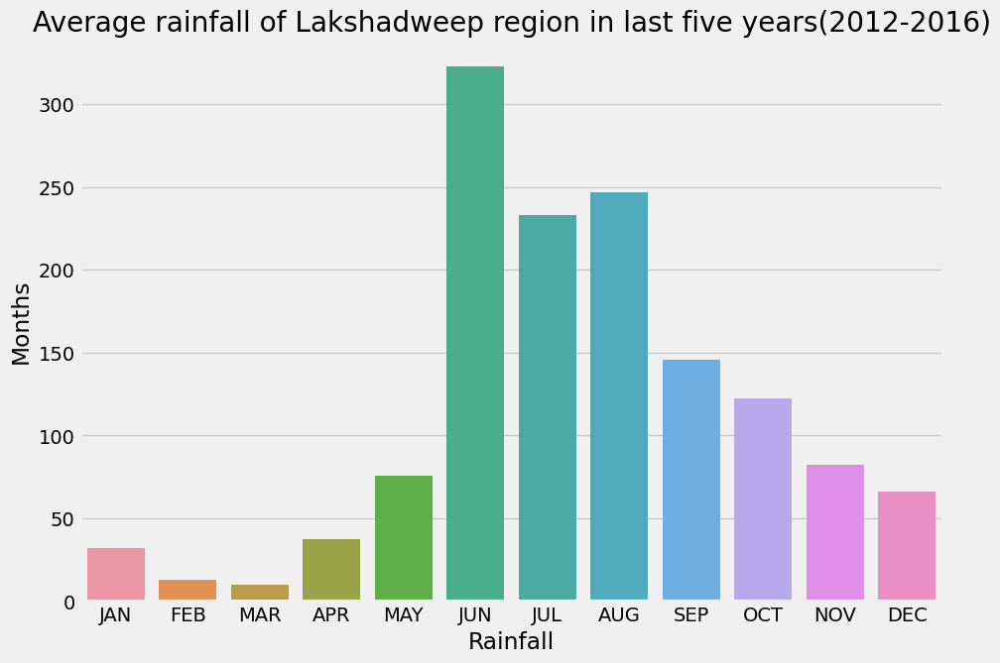

In [25]:
for index in range(len(states)):
    getLast5AvgRainfallData(index)
    print("\n")

### **Now We had average rainfall of last five years**
### **But what if you want average rainfall data of certain period? like(1970-1975)**
### **Let's Do that**

In [26]:
def getAverageStateDataOfPeriod(regionIndex,startYear,endYear,return_data=False):
    if startYear > endYear:
        raise ValueError("Error! startYear>endYear?")
    try:
        stateName = states[regionIndex]
        dfstate = state_df.get_group(states[regionIndex])
        dfstate.set_index('YEAR',inplace=True)

        years_data = dfstate.loc[startYear:endYear][months].mean()


        plt.figure(figsize=(10,7))
        sns.barplot(x=months,y=years_data.values)
        plt.title(f"Average Rainfall Data of {stateName} from {startYear}-{endYear}")
        plt.show()

        if return_data:
            return years_data
    except Exception as e:
        print(e)

# **Average Rainfall Data of Arunachal Pradesh from 1980-1990**

In [36]:
states[12] #Index is 1

'Haryana Delhi & Chandigarh'

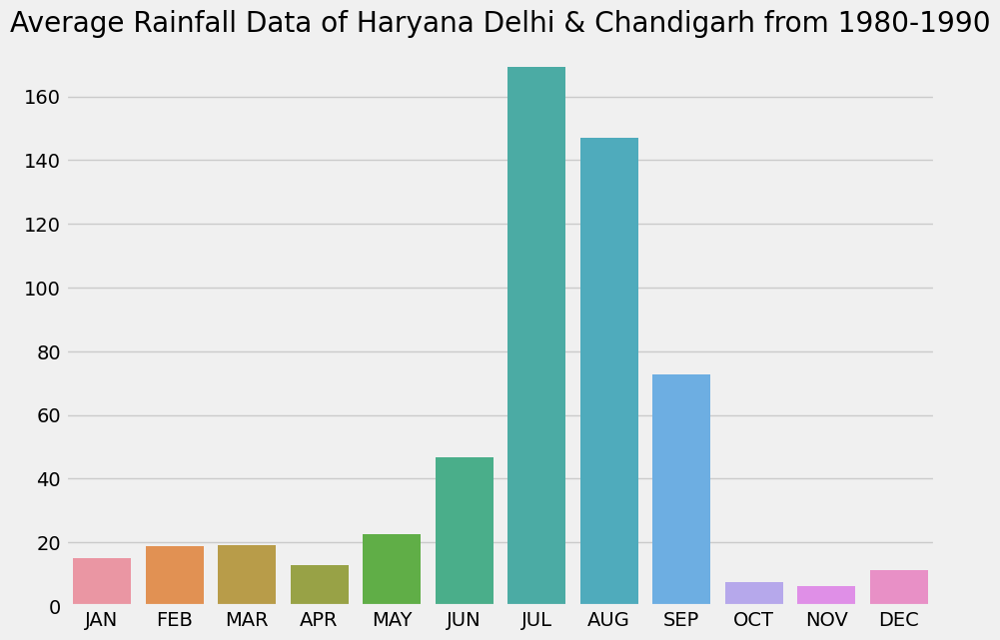

In [38]:
getAverageStateDataOfPeriod(12,startYear=1980,endYear=1990)

# **Average Rainfall Data of Gujarat Region from 1968-1972**

In [29]:
states[20]

'Gujarat Region'

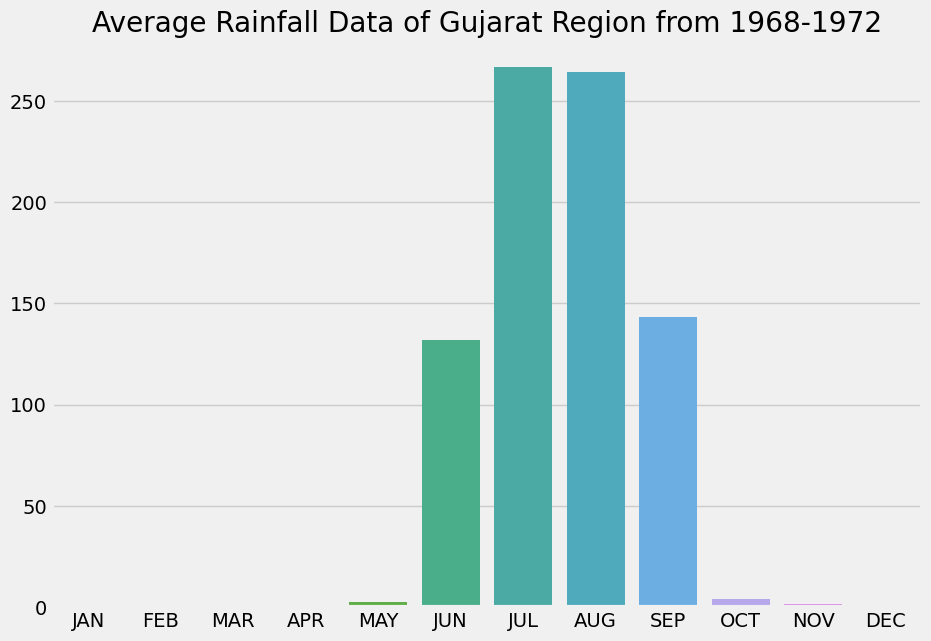

JAN      0.08
FEB      0.72
MAR      0.26
APR      0.08
MAY      2.44
JUN    132.18
JUL    266.72
AUG    264.40
SEP    143.48
OCT      4.26
NOV      1.46
DEC      0.64
dtype: float64

In [30]:
getAverageStateDataOfPeriod(20,1968, 1972, return_data=True)

# **Annual Rainfall of each state (Year wise)**

In [31]:
def getAnnualRainfallStats(regionIndex):
    stateName = states[regionIndex]
    state = state_df.get_group(states[regionIndex])
    years = state['YEAR']

    plt.figure(figsize=(20,7))
    plt.plot(years,state['ANNUAL'])
    plt.title(f"Annual Rainfall of {stateName} Region({years.min()}-{years.max()}).")
    plt.xlabel("Year")
    plt.ylabel("Annual Rainfall")
    plt.show()

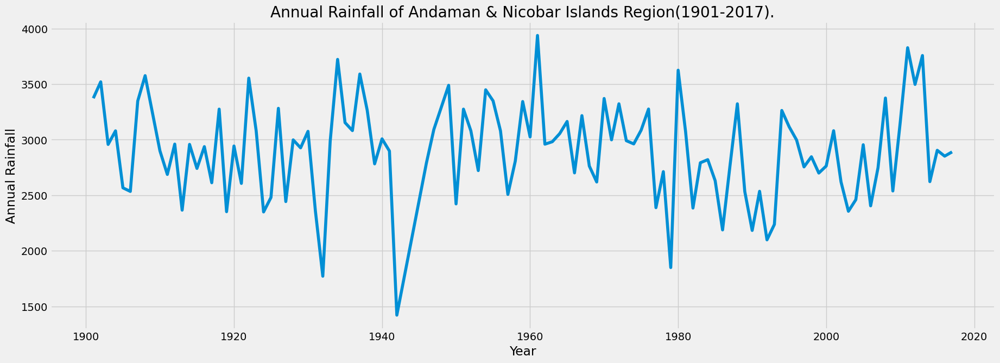

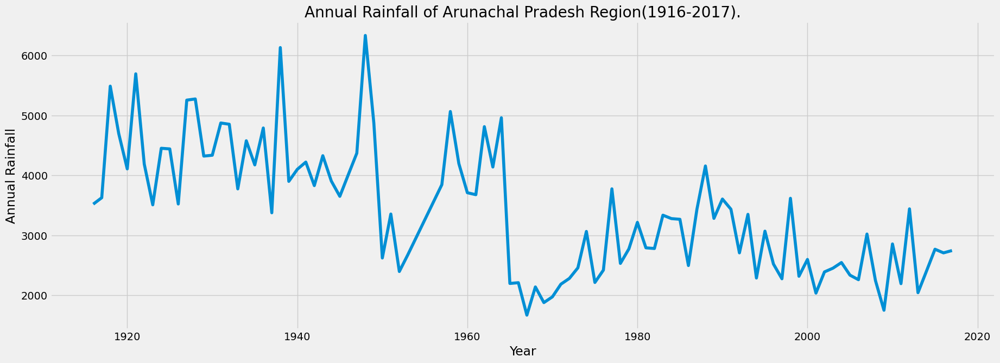

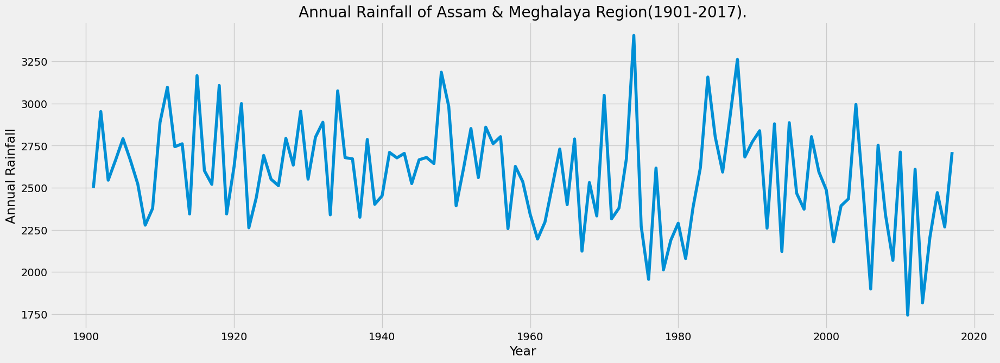

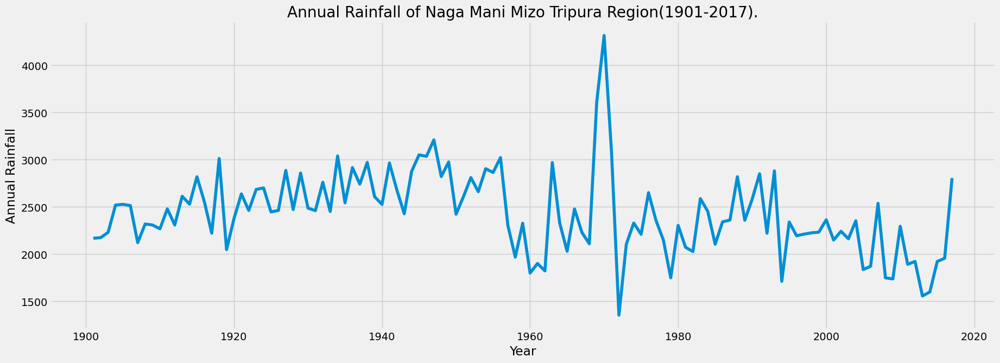

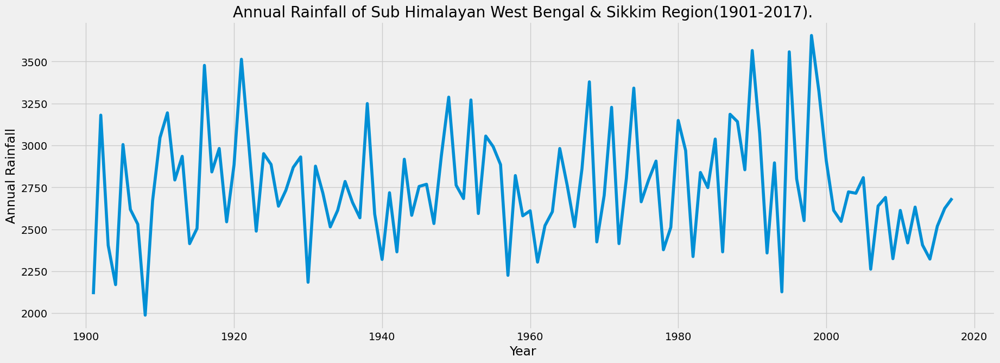

...

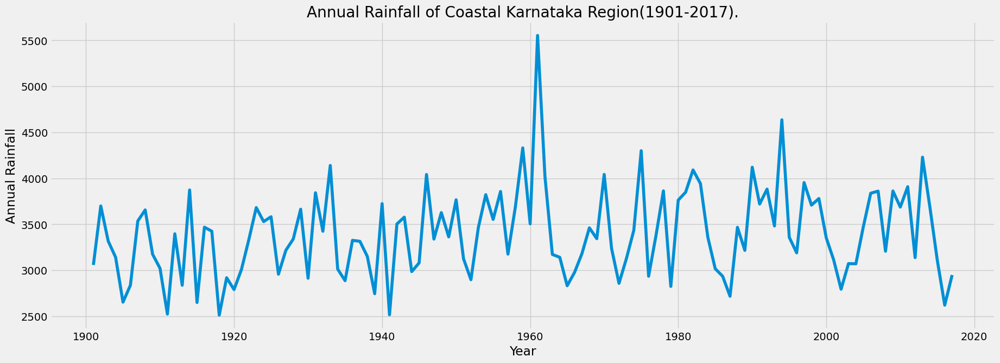

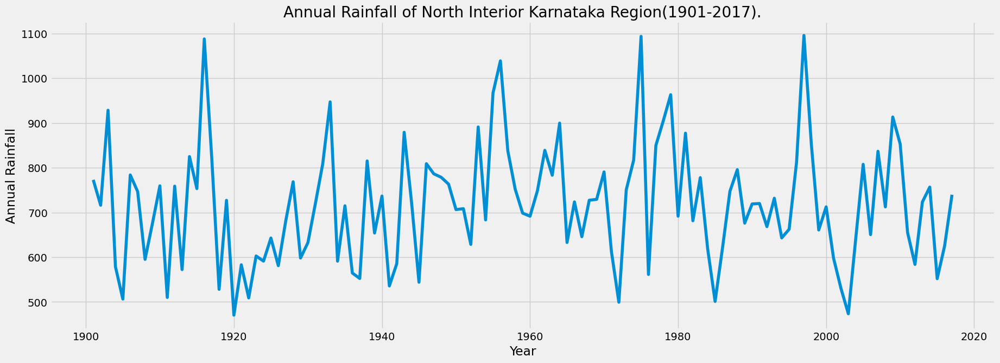

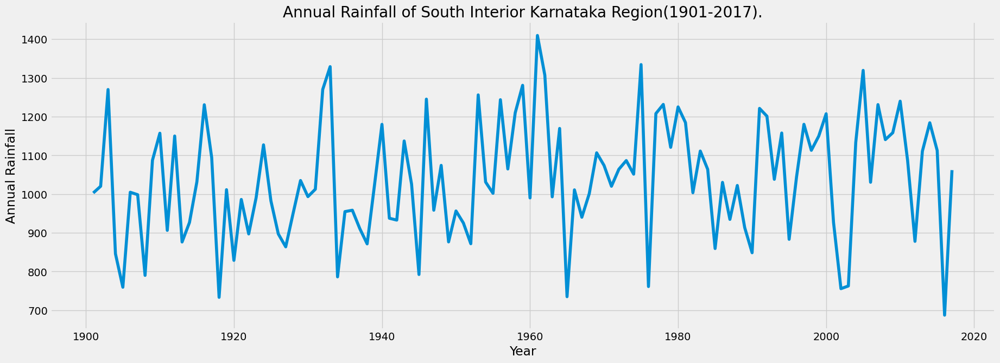

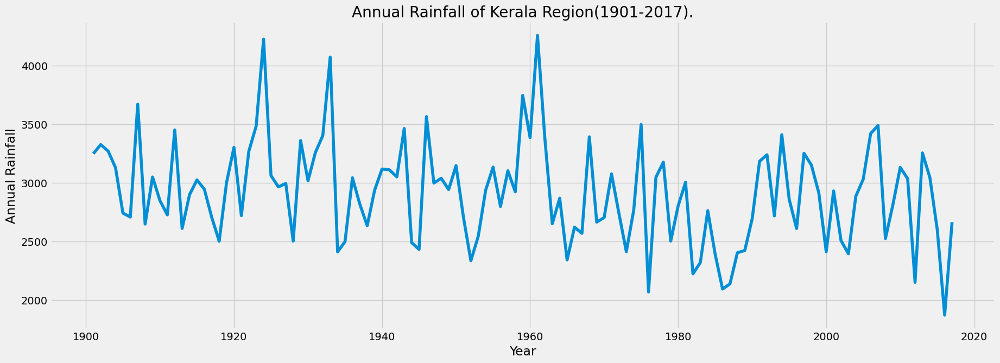

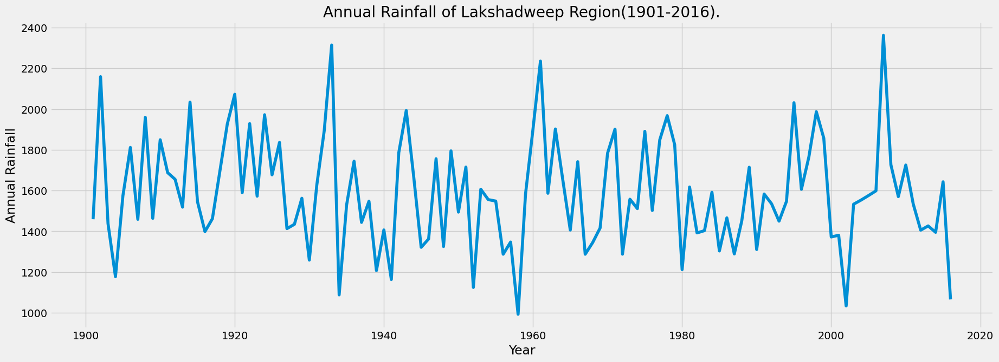

In [32]:
for i in range(len(states)):
    getAnnualRainfallStats(i)
    print("\n")

# **Comparing Annual Rainfalls of all states of a given year**

In [33]:
def AnnaulStateGraph(year):
    try:
        annual_rainfall = []
        for i in range(len(states)):
            state = state_df.get_group(states[i])
            state.set_index('YEAR',inplace=True)
            annual_rainfall.append(state.loc[year]['ANNUAL'])
        plt.figure(figsize=(10,20))
        sns.barplot(x=annual_rainfall,y=states)
        plt.title(f"Annual Rainfall of each state in {year}")
        plt.ylabel("States")
        plt.xlabel("Annual Rainfall.")
        plt.show()
        print(f"Total Annual Rainfall of india in {year}:",np.sum(annual_rainfall))
        print(f"Average Annual Rainfall of state:",np.mean(annual_rainfall))
    except Exception as e:
        print(e)

# **Annual Rainfall of each state in 1999**

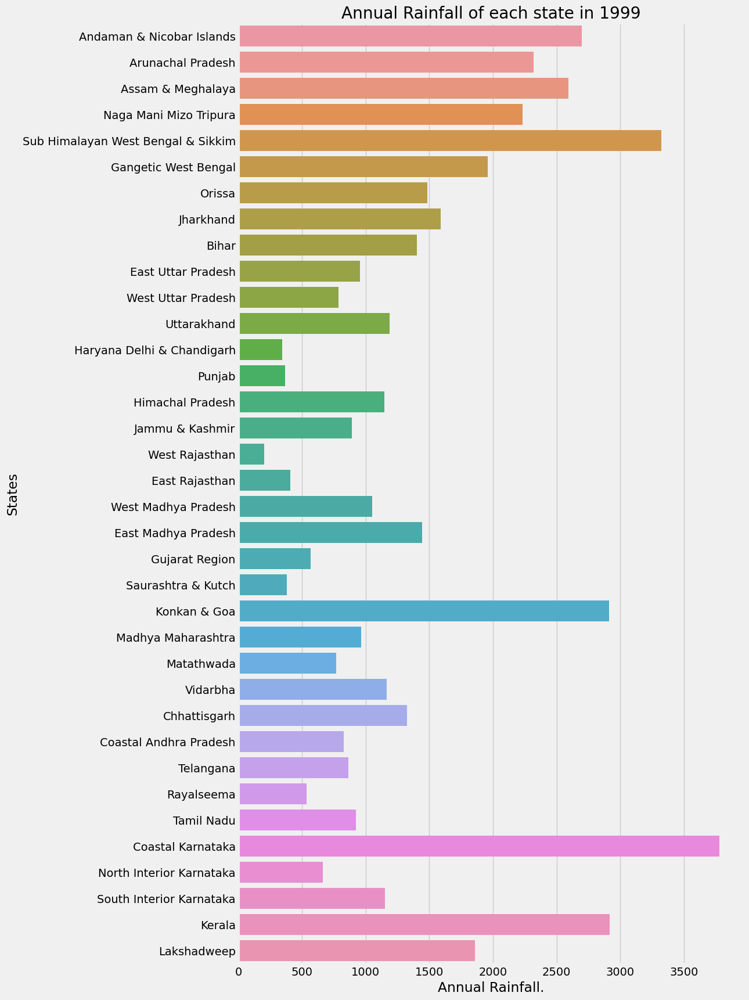

Total Annual Rainfall of india in 1999: 49969.80000000001
Average Annual Rainfall of state: 1388.0500000000002


In [34]:
AnnaulStateGraph(1999)

# **Annual Rainfall of each state in 2015**

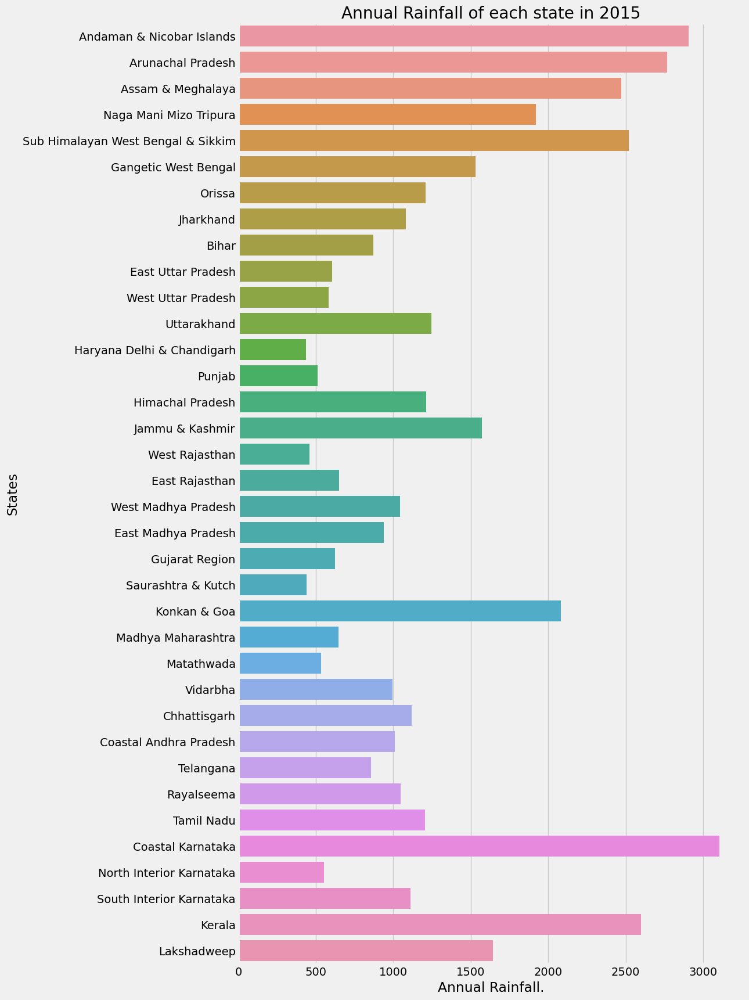

Total Annual Rainfall of india in 2015: 46100.5
Average Annual Rainfall of state: 1280.5694444444443


In [35]:
AnnaulStateGraph(2015)

#### **Similarly you can get Annual rainfall data of each stateof a given year.**
#### **But some some states don't have common years it may cause an error.**

# **That's the analysis I have done on this dataset**